In [3]:
import pygad
import torch
import pygad.cnn
import pygad.gacnn
import pygad.torchga

# do not use this, very slow implementation 
from sklearn.metrics import balanced_accuracy_score
# use torch instead
from torchmetrics.classification import Accuracy

from tqdm import tqdm

import matplotlib.pyplot  as plt 

import numpy as np
import pipe  as pp
import cv2 as cv
import glob
import os

import auto_labeling.guided as alg

In [6]:
# balanced accuracy
metric = Accuracy(task='multiclass', num_classes=2, average='macro')

In [13]:
def get_fitness_func(image, gtruth, labeler, metric):
    def fitness_func(ga_instance, solution, sol_idx):
        p = alg.PSTParameters(*solution)
        labeler.set_params(p)
        pst_res = labeler.apply(image)
        mask_res = pst_res._mask
        res=torch.from_numpy(mask_res > 0)

        return float(metric(res, gtruth))
    
    return fitness_func

def get_on_generation_func(descr):
    def on_generation(ga_instance):
        #print(f"[{descr}] Generation = {ga_instance.generations_completed}")
        if(ga_instance.generations_completed==1):
            print(f"[{descr}] starting next GA iterations...")
            print(f"[{descr}] initial fitness = {ga_instance.best_solution()[1]}")
    
    return on_generation

In [20]:
def run_ga_for(image, gtruth, labeler, metric, descr, init_pop=None):
    # Prepare the PyGAD parameters. Check the documentation for more information: https://pygad.readthedocs.io/en/latest/pygad.html#pygad-ga-class
    num_generations = 250 # Number of generations.
    num_parents_mating = 7 # Number of solutions to be selected as parents in the mating pool.
    sol_per_pop = 15       # Number of solutions in the population.
    num_genes = 5
    keep_parents = 7 # Number of parents to keep in the next population. -1 means keep all parents and 0 means keep nothing.
    mutation_percent_genes = 20

    gene_space = [{"low": 1, "high": 2000}, 
                  {"low": 1, "high": 2000}, 
                  {"low": 0, "high": 0.5}, 
                  {"low": 0, "high": 0.8}, 
                  {"low": 0, "high": 1},]
    # Create an instance of the pygad.GA class
    ga_instance = pygad.GA(num_generations=num_generations,
                           num_parents_mating=num_parents_mating, 
                           sol_per_pop=sol_per_pop, 
                           num_genes=num_genes,
                           initial_population=init_pop,
                           keep_parents=keep_parents,
                           mutation_percent_genes=mutation_percent_genes,
                           fitness_func=get_fitness_func(image, gtruth, labeler, metric),
                           on_generation=get_on_generation_func(descr),
                           gene_space=gene_space)

    # Start the genetic algorithm evolution.
    ga_instance.run()
    ga_instance.plot_fitness()

    solution = ga_instance.best_solution()[0]
    fitness  = ga_instance.best_solution()[1] 
    p = alg.PSTParameters(*solution)
    labeler.set_params(p)
    pst_res = labeler.apply(image)

    f, axarr = plt.subplots(1,3)
    axarr[0].axis("off")
    axarr[1].axis("off")
    axarr[2].axis("off")
    axarr[0].imshow(gtruth)
    axarr[1].imshow(pst_res._mask)
    axarr[2].imshow(image, cmap=plt.cm.grey)
    print(f"found solution with fitness {fitness}")
    plt.show()

    return solution, fitness, ga_instance.population


In [21]:
def load_data(path, shape):
    fl_npylike = glob.glob(os.path.join(path, "*.npy"))
    fl_basenames = list(fl_npylike | pp.map(os.path.basename))

    fl_images   = next(fl_basenames | pp.filter(lambda s: "images"       in s and f"{shape[0]}_{shape[1]}" in s))
    fl_gtruth   = next(fl_basenames | pp.filter(lambda s: "ground_truth" in s and f"{shape[0]}_{shape[1]}" in s))
    fl_metadata = next(fl_basenames | pp.filter(lambda s: "metadata"     in s and f"{shape[0]}_{shape[1]}" in s))

    imgs = np.load(os.path.join(path, fl_images))
    g_imgs = []
    for img in imgs:
        g_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
        g_imgs.append(g_img)
        
    return np.stack(g_imgs), torch.Tensor(np.load(os.path.join(path, fl_gtruth)) > 0), np.load(os.path.join(path, fl_metadata))

In [22]:
pshape = (512,512)
images, gtruth, metadata = load_data("../dataset/", pshape)

/home/nzuri/Projects/TP-OptiLabel/.venv/lib/python3.10/site-packages/pygad/pygad.py:1139: UserWarning: The 'delay_after_gen' parameter is deprecated starting from PyGAD 3.3.0. To delay or pause the evolution after each generation, assign a callback function/method to the 'on_generation' parameter to adds some time delay.
  warnings.warn("The 'delay_after_gen' parameter is deprecated starting from PyGAD 3.3.0. To delay or pause the evolution after each generation, assign a callback function/method to the 'on_generation' parameter to adds some time delay.")


[img 1/450] starting next GA iterations...
[img 1/450] initial fitness = 0.856121838092804


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


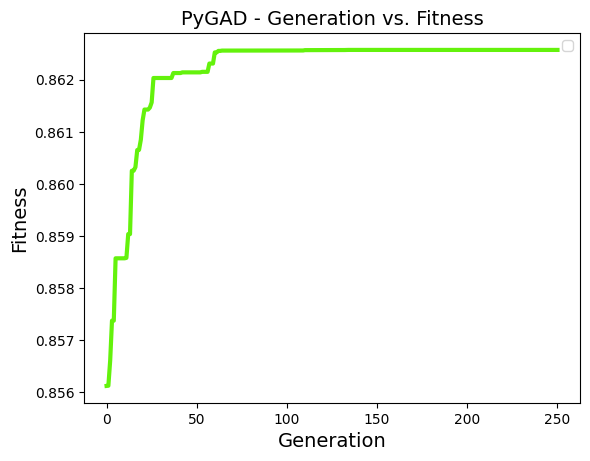

found solution with fitness 0.8625737428665161


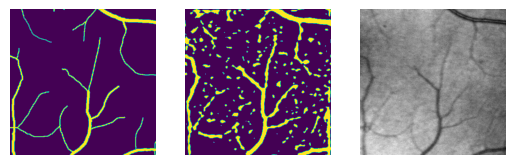

[img 2/450] starting next GA iterations...
[img 2/450] initial fitness = 0.864738941192627


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


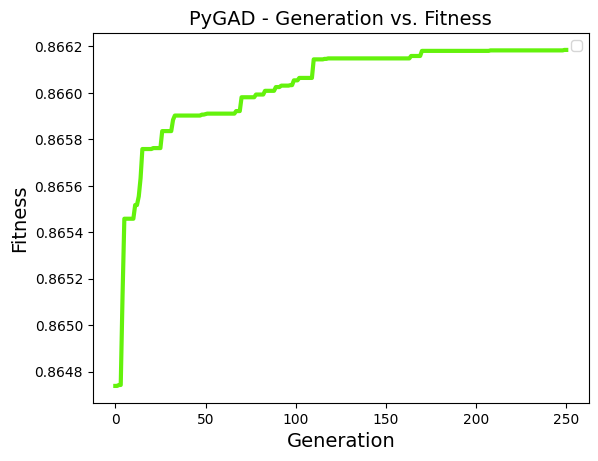

found solution with fitness 0.8661849498748779


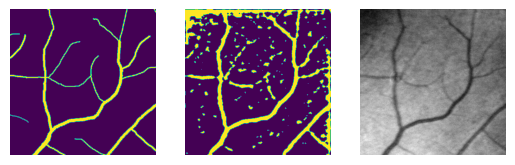

[img 3/450] starting next GA iterations...
[img 3/450] initial fitness = 0.8543976545333862


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


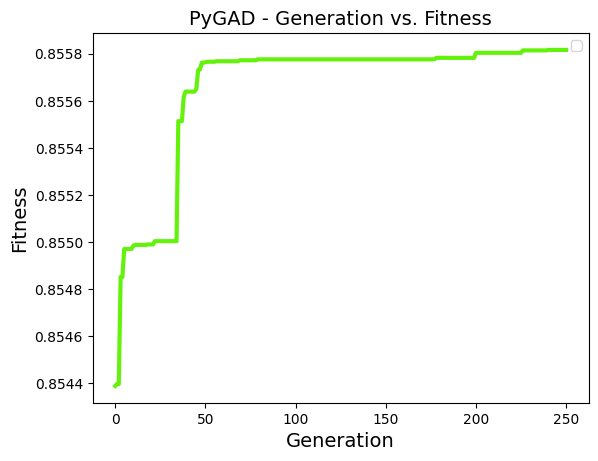

found solution with fitness 0.855816125869751


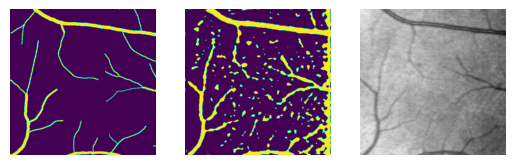

[img 4/450] starting next GA iterations...
[img 4/450] initial fitness = 0.8140945434570312


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


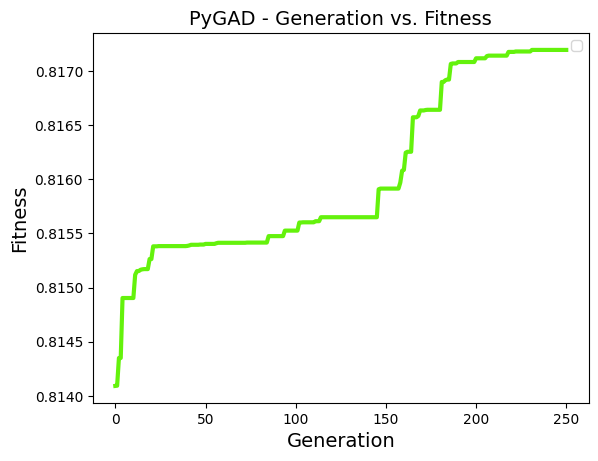

found solution with fitness 0.8171929121017456


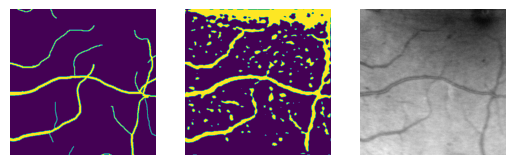

[img 5/450] starting next GA iterations...
[img 5/450] initial fitness = 0.8675816059112549


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


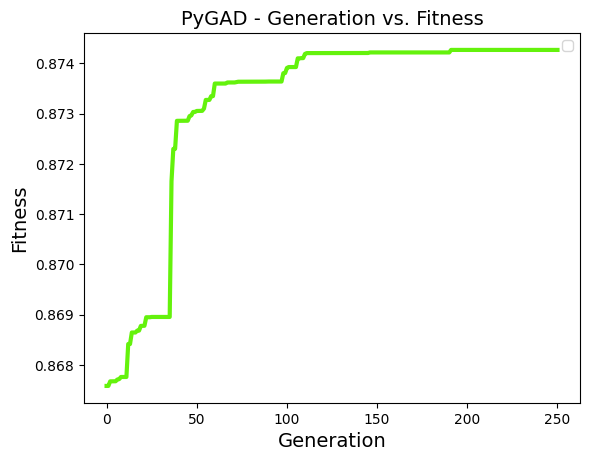

found solution with fitness 0.8742662668228149


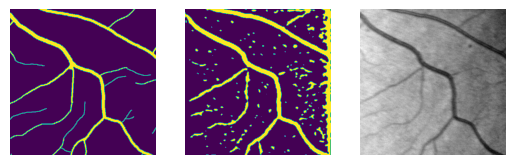

[img 6/450] starting next GA iterations...
[img 6/450] initial fitness = 0.8451728820800781


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


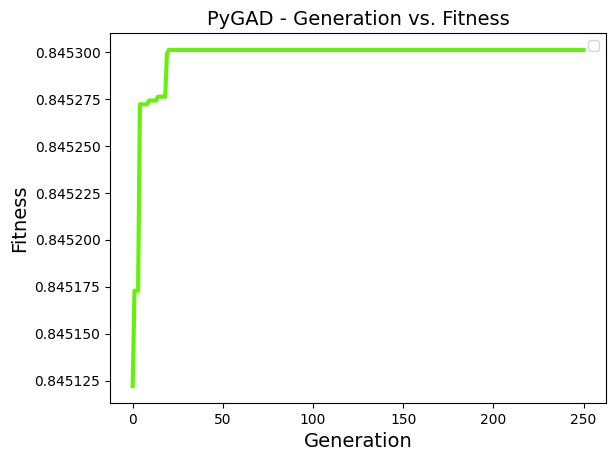

found solution with fitness 0.8453010320663452


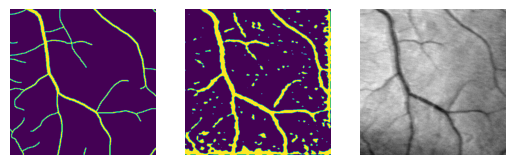

[img 7/450] starting next GA iterations...
[img 7/450] initial fitness = 0.8709366321563721


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


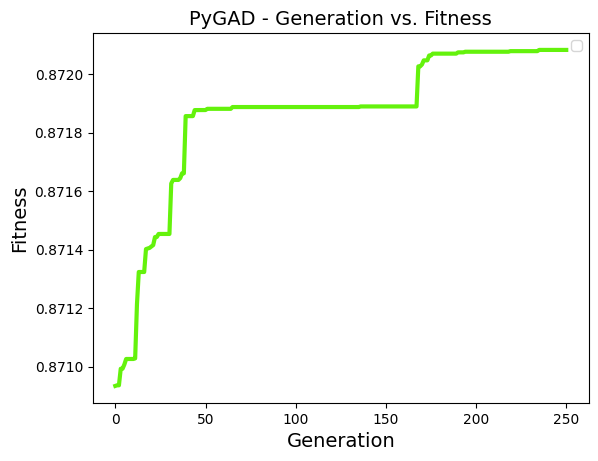

found solution with fitness 0.8720824718475342


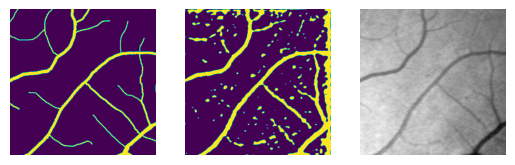

[img 8/450] starting next GA iterations...
[img 8/450] initial fitness = 0.8373532891273499


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


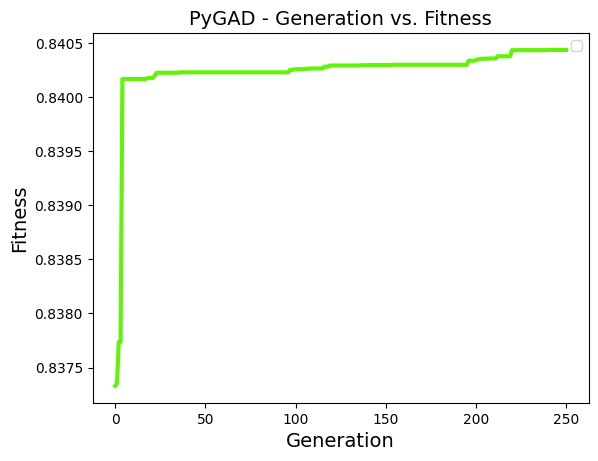

found solution with fitness 0.8404371738433838


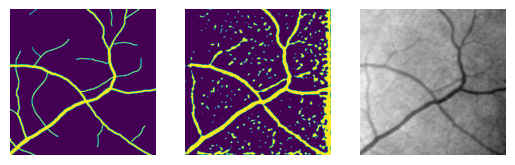

[img 9/450] starting next GA iterations...
[img 9/450] initial fitness = 0.771984338760376


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


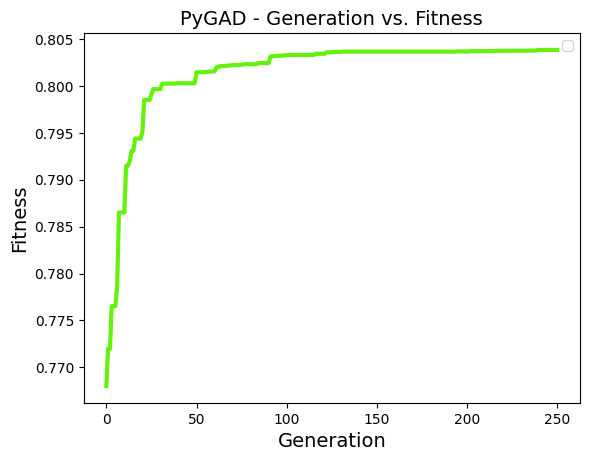

found solution with fitness 0.8038367033004761


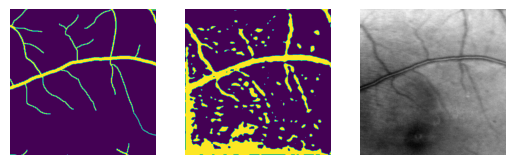

[img 10/450] starting next GA iterations...
[img 10/450] initial fitness = 0.8308151960372925


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


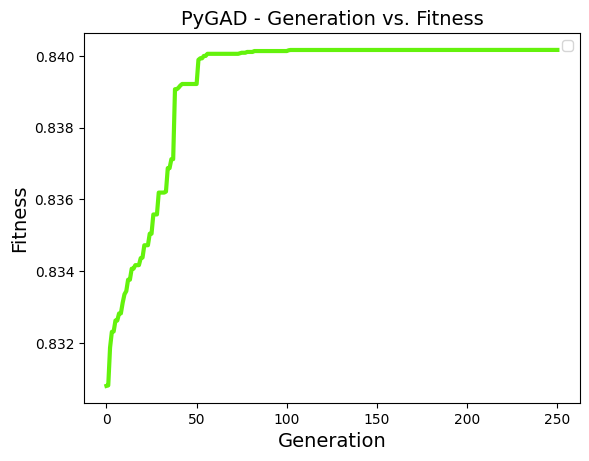

found solution with fitness 0.840164303779602


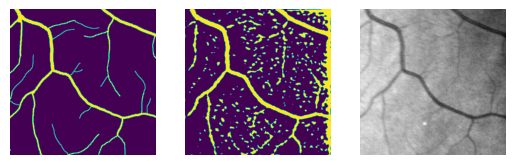

[img 11/450] starting next GA iterations...
[img 11/450] initial fitness = 0.8550140857696533


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


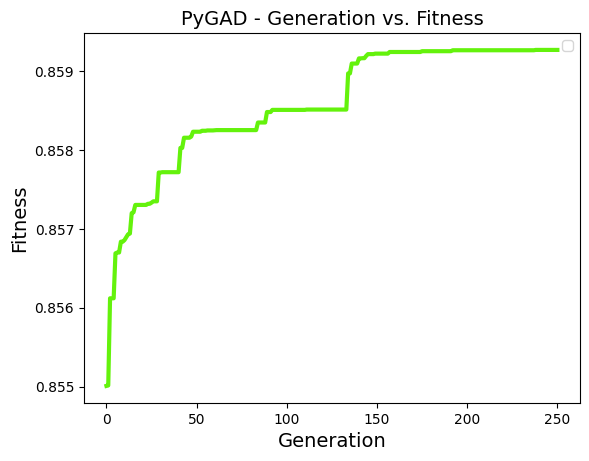

found solution with fitness 0.8592711687088013


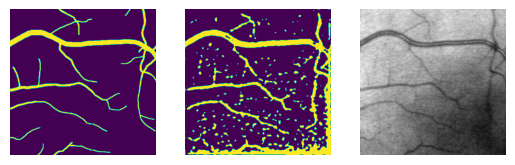

[img 12/450] starting next GA iterations...
[img 12/450] initial fitness = 0.8946214914321899


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


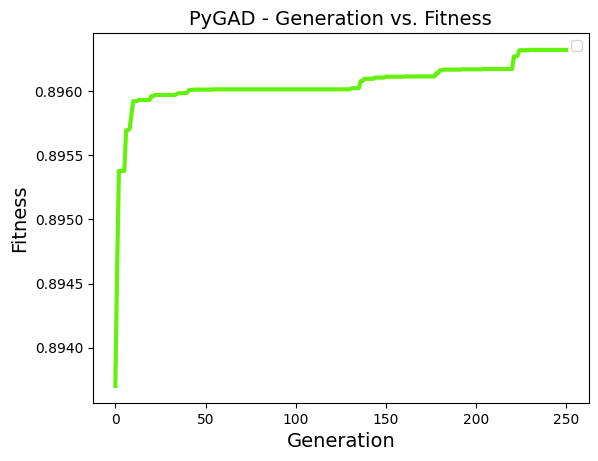

found solution with fitness 0.896318793296814


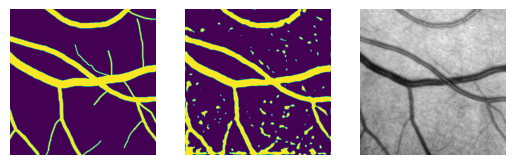

[img 13/450] starting next GA iterations...
[img 13/450] initial fitness = 0.907355785369873


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


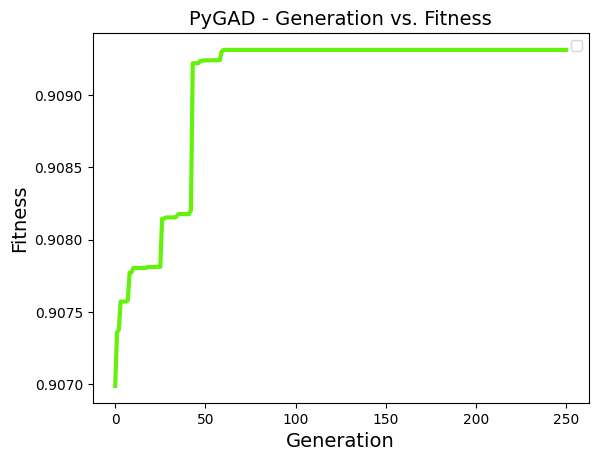

found solution with fitness 0.9093143939971924


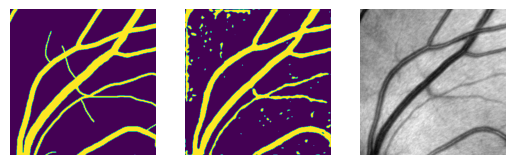

[img 14/450] starting next GA iterations...
[img 14/450] initial fitness = 0.9114484786987305


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


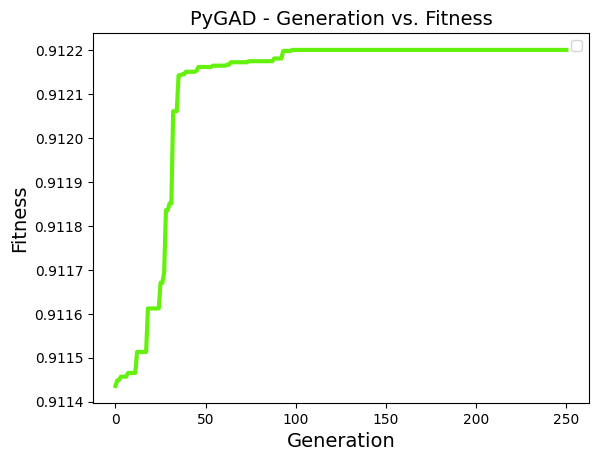

found solution with fitness 0.9122005701065063


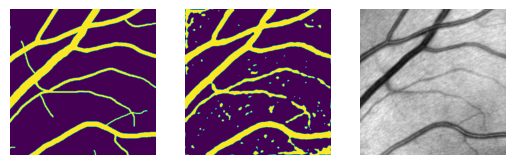

[img 15/450] starting next GA iterations...
[img 15/450] initial fitness = 0.8638564348220825


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


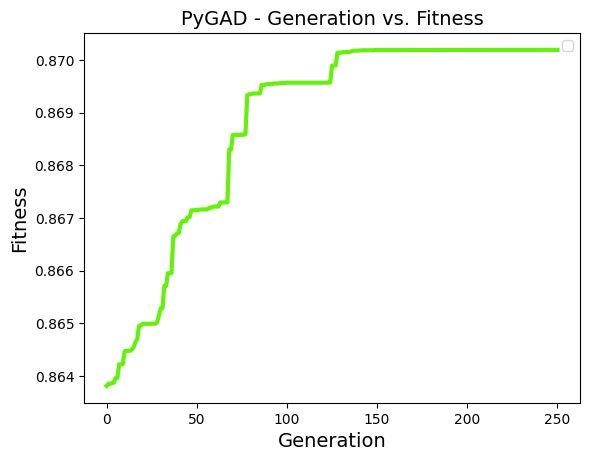

found solution with fitness 0.8701900243759155


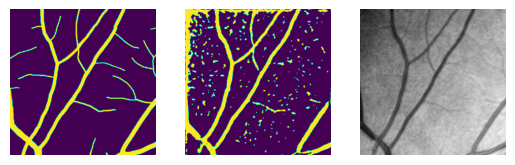

[img 16/450] starting next GA iterations...
[img 16/450] initial fitness = 0.8865038752555847


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


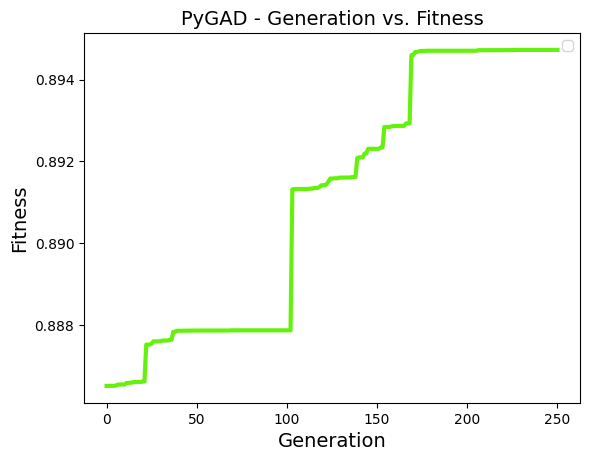

found solution with fitness 0.8947303891181946


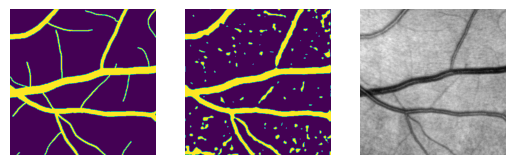

[img 17/450] starting next GA iterations...
[img 17/450] initial fitness = 0.7793183326721191


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


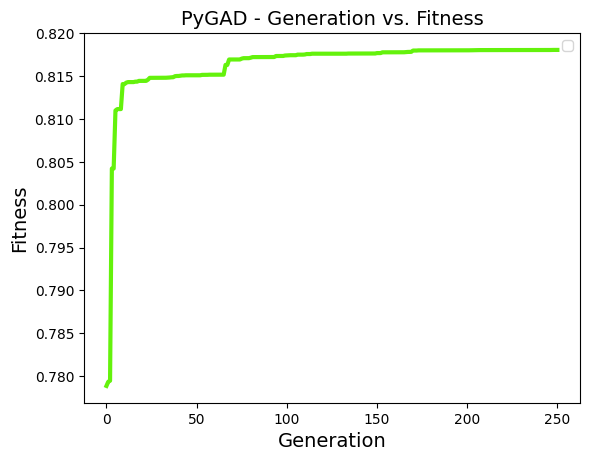

found solution with fitness 0.8180787563323975


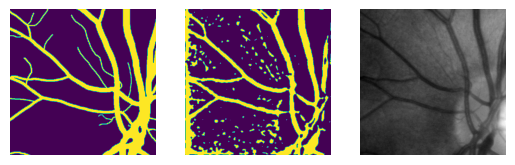

[img 18/450] starting next GA iterations...
[img 18/450] initial fitness = 0.8696441650390625


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


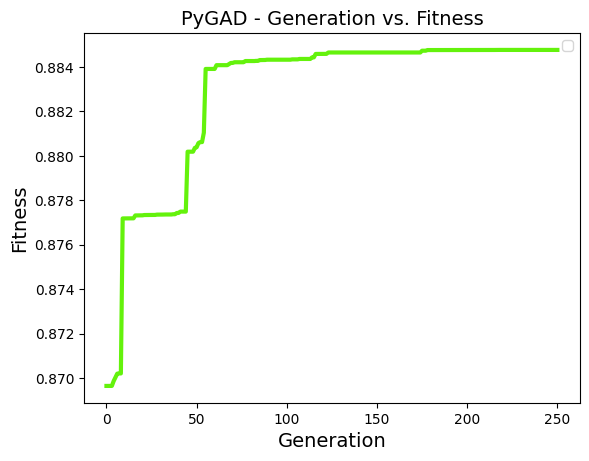

found solution with fitness 0.8847683668136597


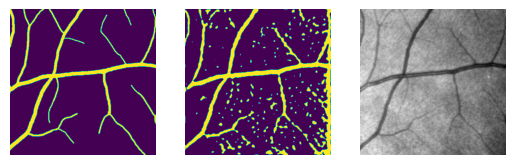

[img 19/450] starting next GA iterations...
[img 19/450] initial fitness = 0.8462538719177246


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


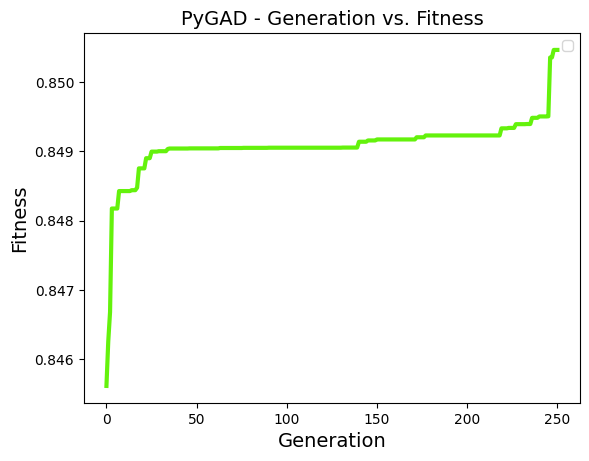

found solution with fitness 0.8504647016525269


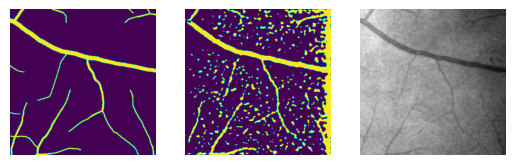

[img 20/450] starting next GA iterations...
[img 20/450] initial fitness = 0.8884633779525757


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


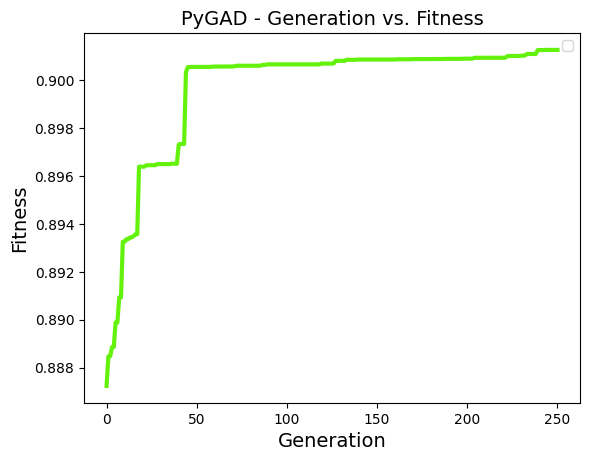

found solution with fitness 0.9012730121612549


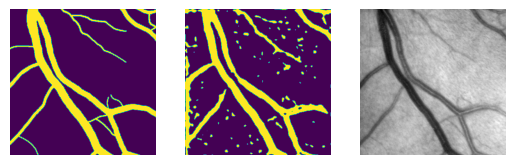

[img 21/450] starting next GA iterations...
[img 21/450] initial fitness = 0.8417507410049438


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


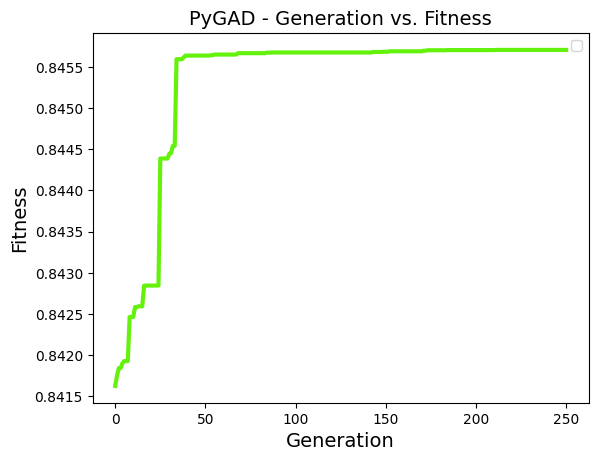

found solution with fitness 0.845705509185791


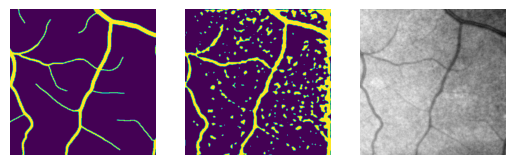

[img 22/450] starting next GA iterations...
[img 22/450] initial fitness = 0.8616242408752441


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


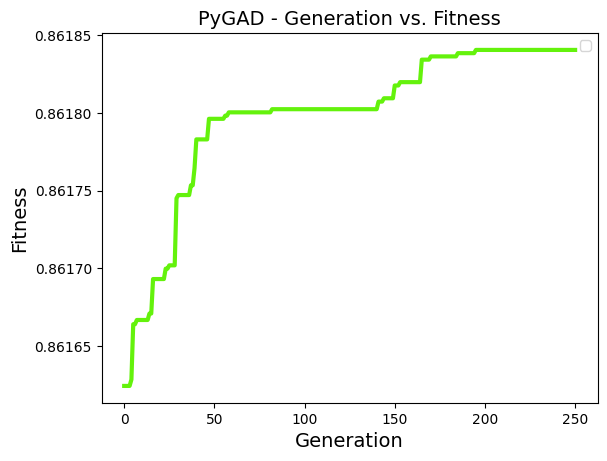

found solution with fitness 0.8618404865264893


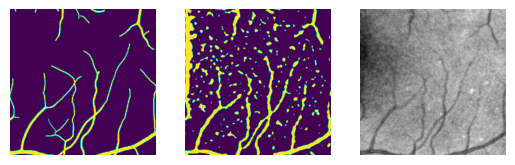

[img 23/450] starting next GA iterations...
[img 23/450] initial fitness = 0.885884702205658


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


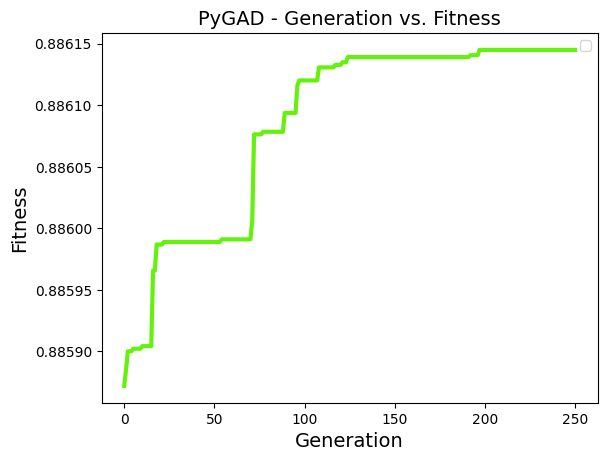

found solution with fitness 0.8861449956893921


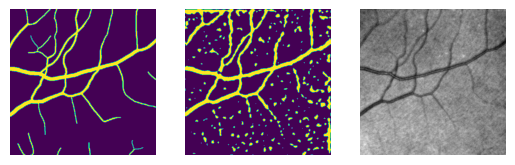

[img 24/450] starting next GA iterations...
[img 24/450] initial fitness = 0.8358698487281799


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


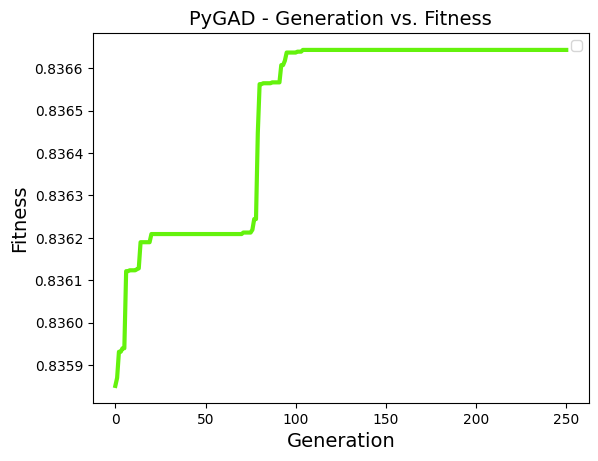

found solution with fitness 0.8366432189941406


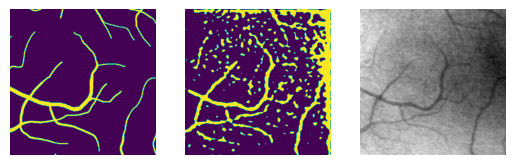

[img 25/450] starting next GA iterations...
[img 25/450] initial fitness = 0.8787000179290771


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


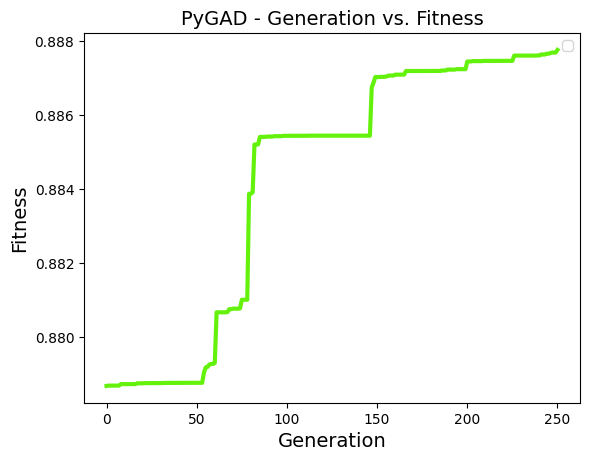

found solution with fitness 0.8876832723617554


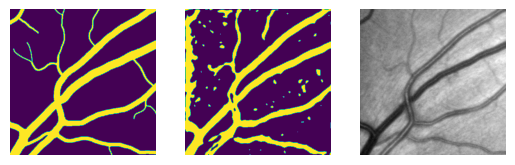

[img 26/450] starting next GA iterations...
[img 26/450] initial fitness = 0.8575764894485474


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


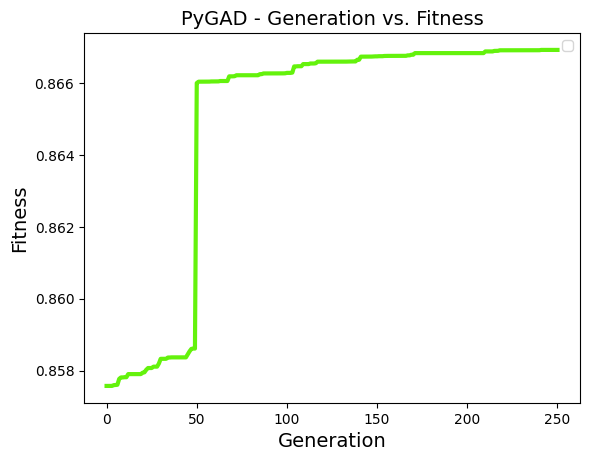

found solution with fitness 0.8669196367263794


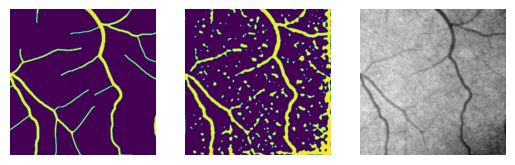

[img 27/450] starting next GA iterations...
[img 27/450] initial fitness = 0.850305438041687


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


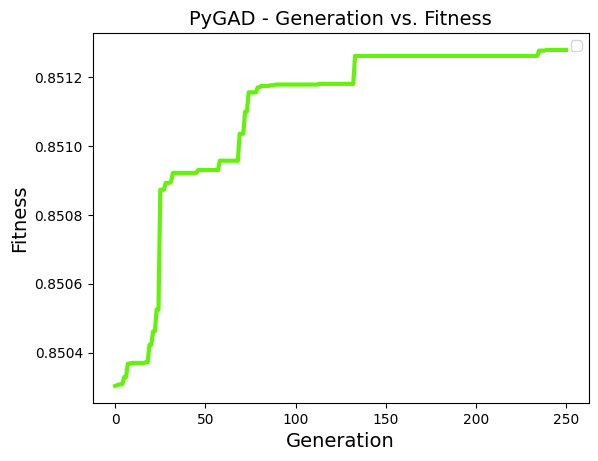

found solution with fitness 0.85127854347229


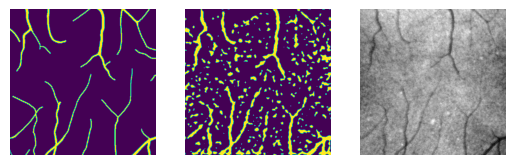

[img 28/450] starting next GA iterations...
[img 28/450] initial fitness = 0.8347421288490295


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


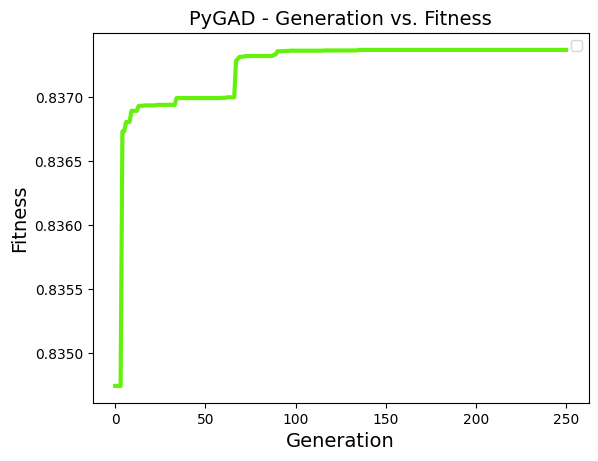

found solution with fitness 0.8373676538467407


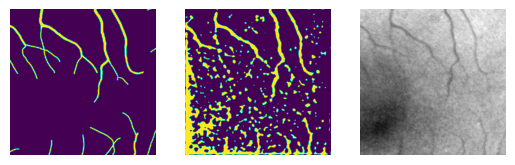

[img 29/450] starting next GA iterations...
[img 29/450] initial fitness = 0.842737078666687


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


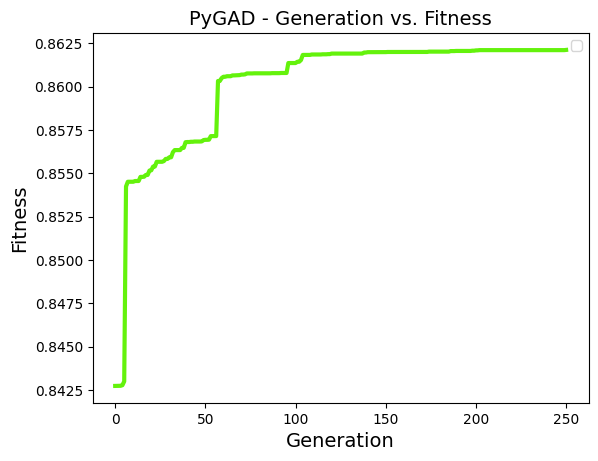

found solution with fitness 0.8621087074279785


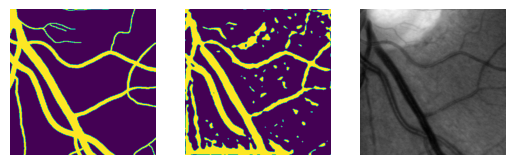

[img 30/450] starting next GA iterations...
[img 30/450] initial fitness = 0.8865596652030945


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


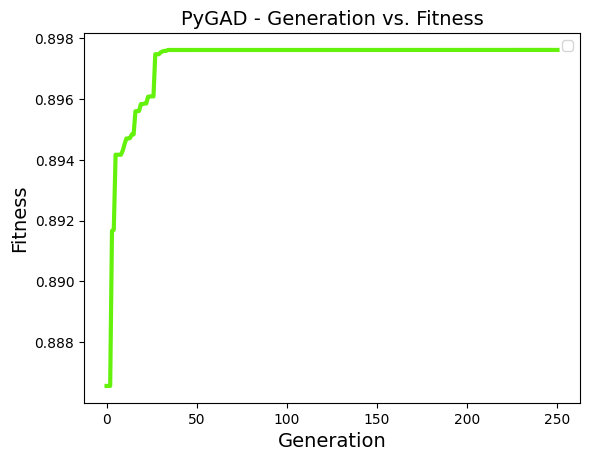

found solution with fitness 0.8976173400878906


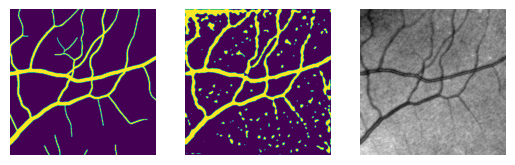

[img 31/450] starting next GA iterations...
[img 31/450] initial fitness = 0.8983672857284546


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


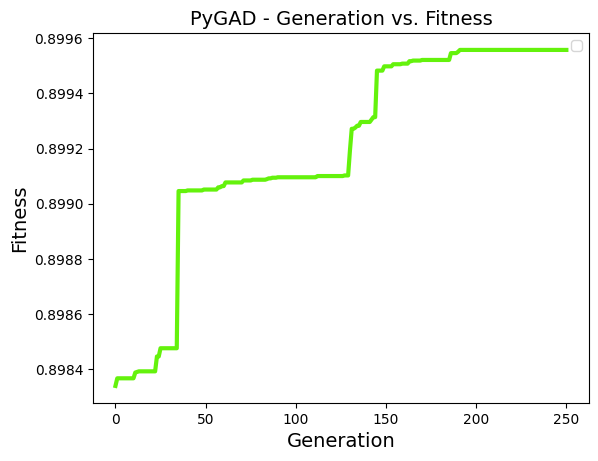

found solution with fitness 0.8995572328567505


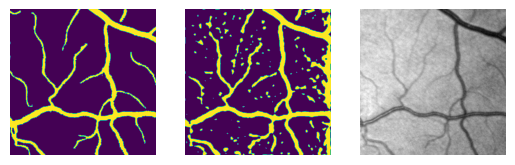

[img 32/450] starting next GA iterations...
[img 32/450] initial fitness = 0.8909571766853333


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


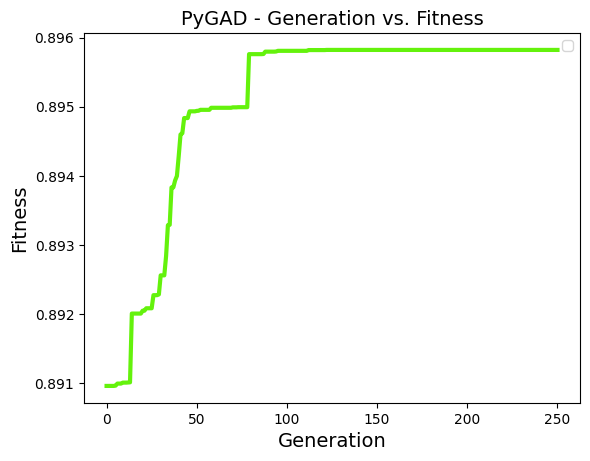

found solution with fitness 0.8958226442337036


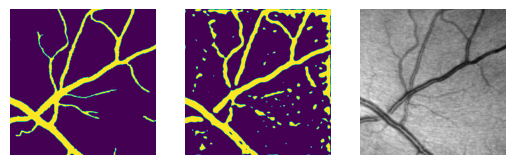

[img 33/450] starting next GA iterations...
[img 33/450] initial fitness = 0.8811161518096924


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


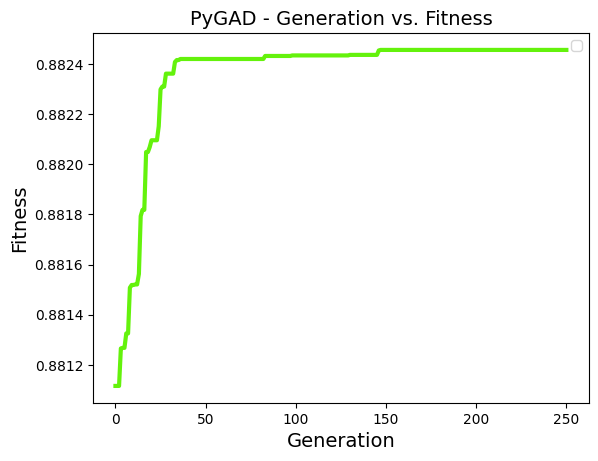

found solution with fitness 0.8824553489685059


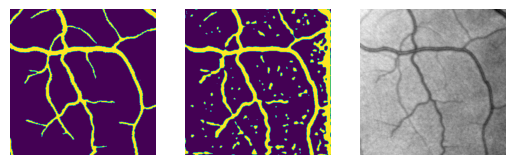

[img 34/450] starting next GA iterations...
[img 34/450] initial fitness = 0.8952293395996094


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


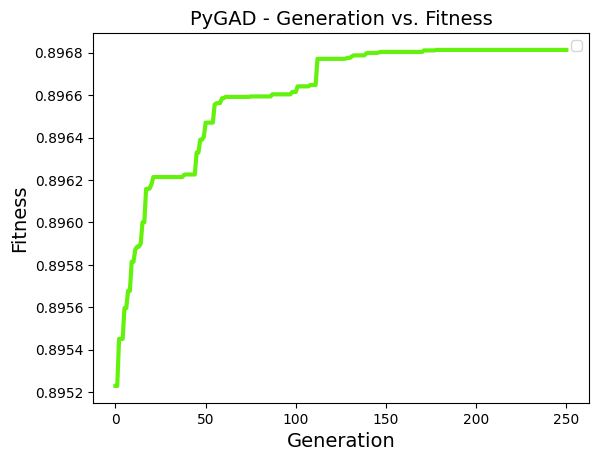

found solution with fitness 0.8968135118484497


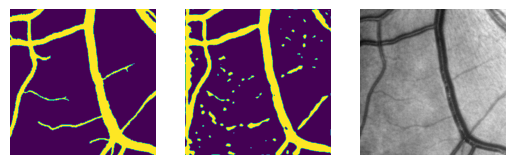

[img 35/450] starting next GA iterations...
[img 35/450] initial fitness = 0.865141749382019


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


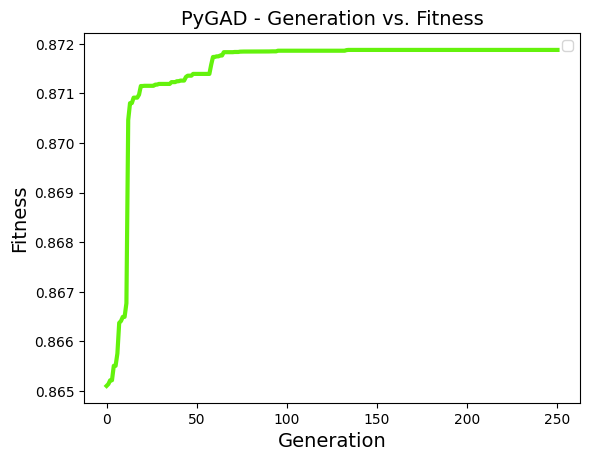

found solution with fitness 0.8718768358230591


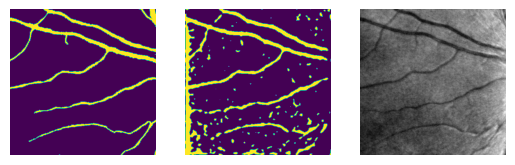

[img 36/450] starting next GA iterations...
[img 36/450] initial fitness = 0.8334978818893433


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


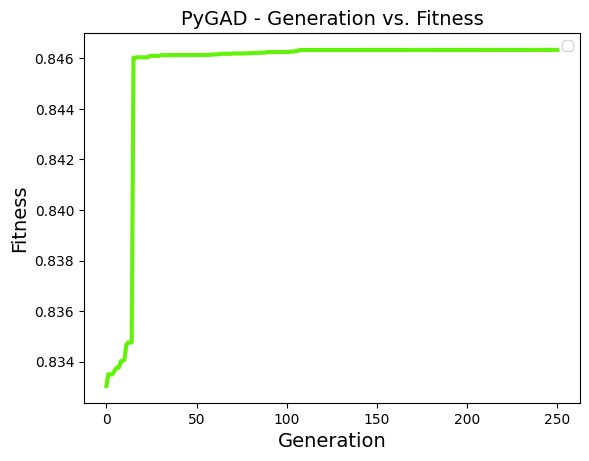

found solution with fitness 0.8463330268859863


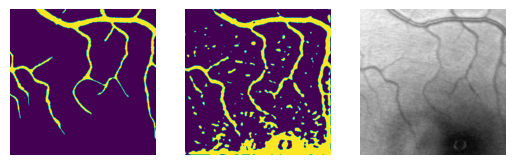

[img 37/450] starting next GA iterations...
[img 37/450] initial fitness = 0.8579173684120178


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


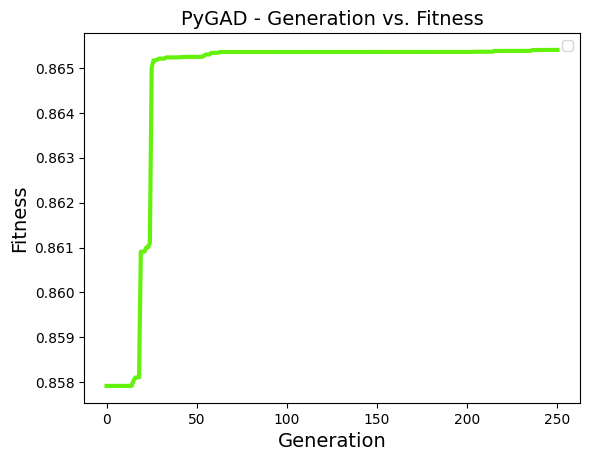

found solution with fitness 0.8654030561447144


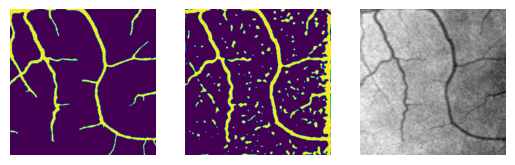

[img 38/450] starting next GA iterations...
[img 38/450] initial fitness = 0.8524349927902222


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


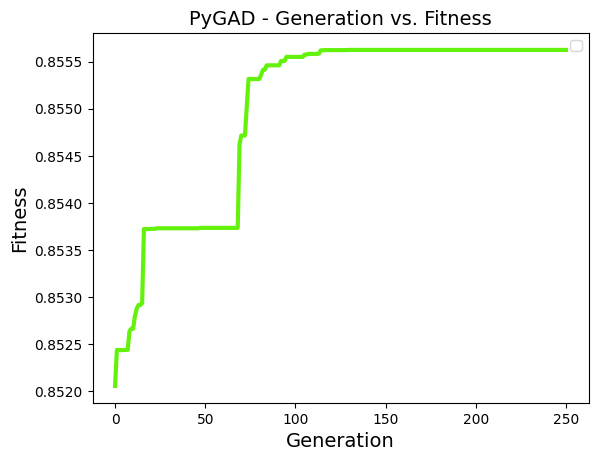

found solution with fitness 0.8556258082389832


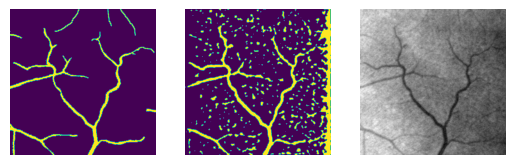

[img 39/450] starting next GA iterations...
[img 39/450] initial fitness = 0.8521385192871094


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


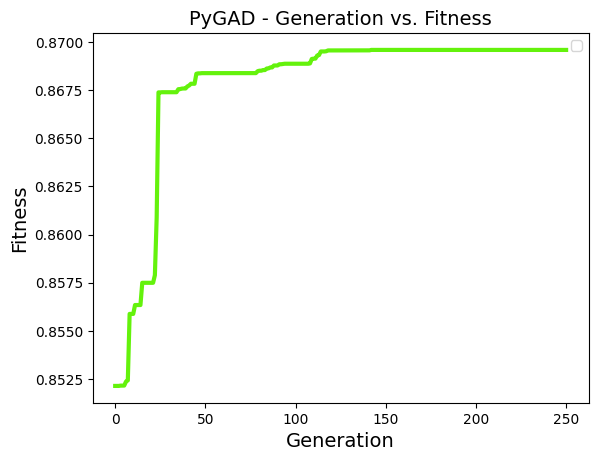

found solution with fitness 0.8695888519287109


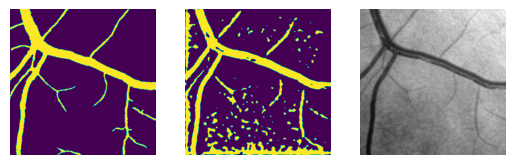

[img 40/450] starting next GA iterations...
[img 40/450] initial fitness = 0.8540534973144531


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


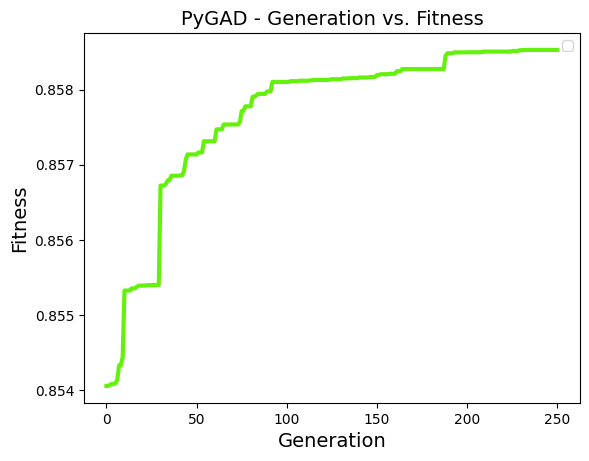

found solution with fitness 0.8585293292999268


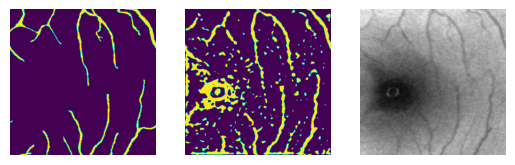

[img 41/450] starting next GA iterations...
[img 41/450] initial fitness = 0.8706262111663818


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


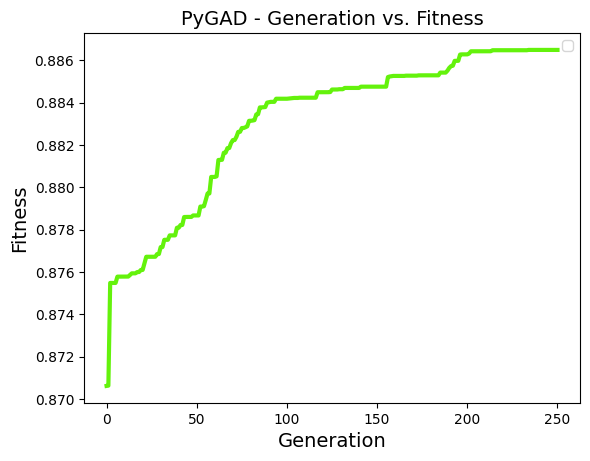

found solution with fitness 0.8864879608154297


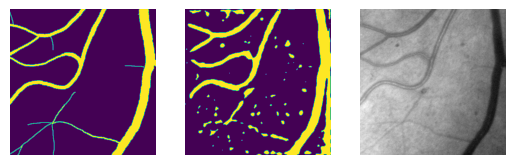

[img 42/450] starting next GA iterations...
[img 42/450] initial fitness = 0.843634843826294


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


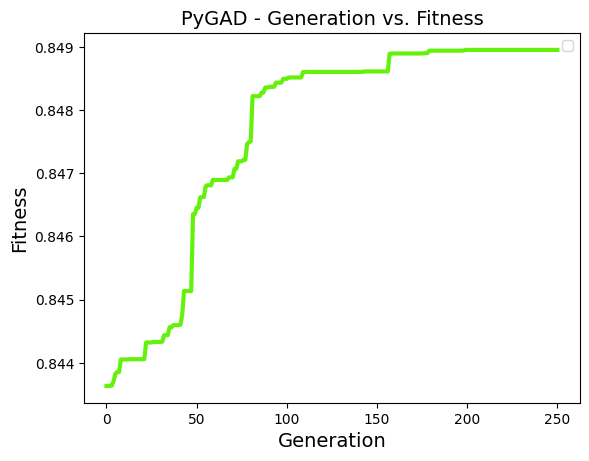

found solution with fitness 0.848950982093811


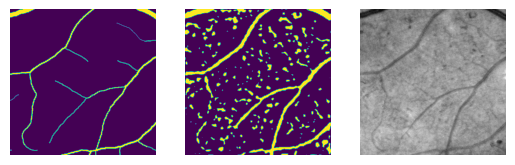

[img 43/450] starting next GA iterations...
[img 43/450] initial fitness = 0.8817352056503296


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


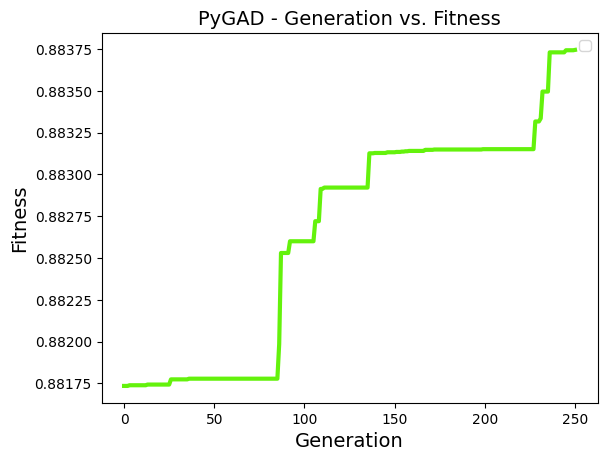

found solution with fitness 0.8837430477142334


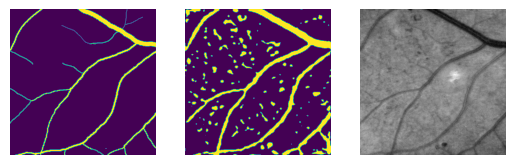

[img 44/450] starting next GA iterations...
[img 44/450] initial fitness = 0.8961509466171265


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


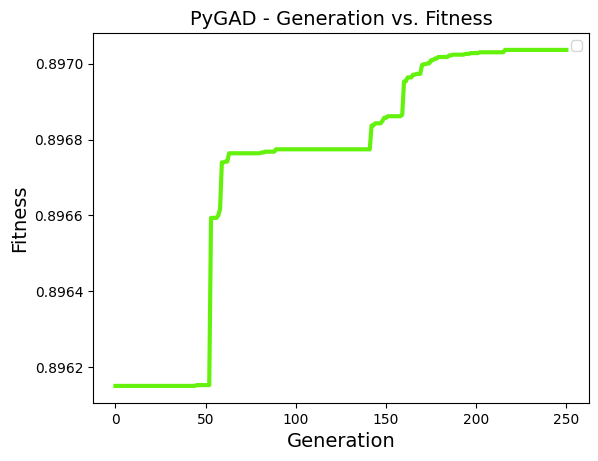

found solution with fitness 0.8970359563827515


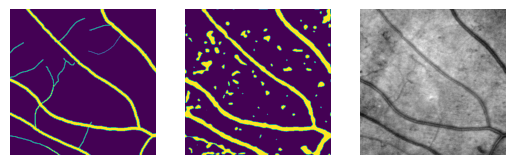

[img 45/450] starting next GA iterations...
[img 45/450] initial fitness = 0.8466245532035828


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


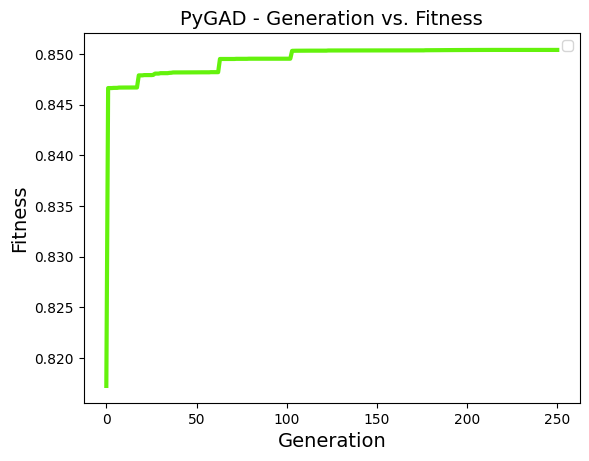

found solution with fitness 0.8503878116607666


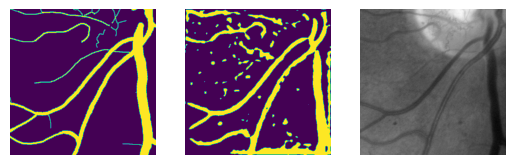

[img 46/450] starting next GA iterations...
[img 46/450] initial fitness = 0.7750171422958374


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


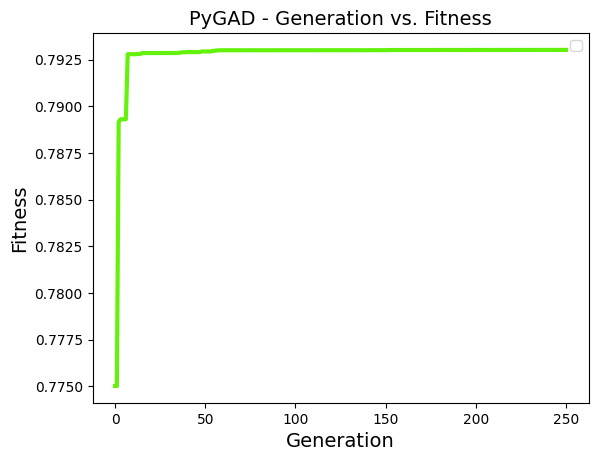

found solution with fitness 0.7930244207382202


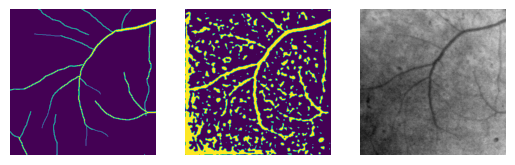

[img 47/450] starting next GA iterations...
[img 47/450] initial fitness = 0.7697696685791016


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


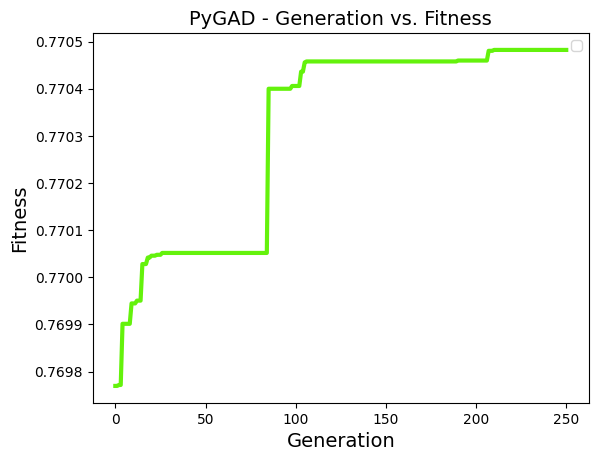

found solution with fitness 0.7704823017120361


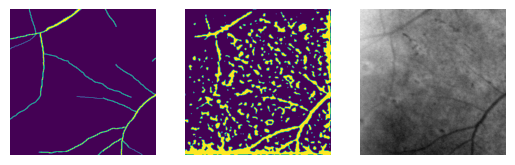

[img 48/450] starting next GA iterations...
[img 48/450] initial fitness = 0.8793166875839233


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


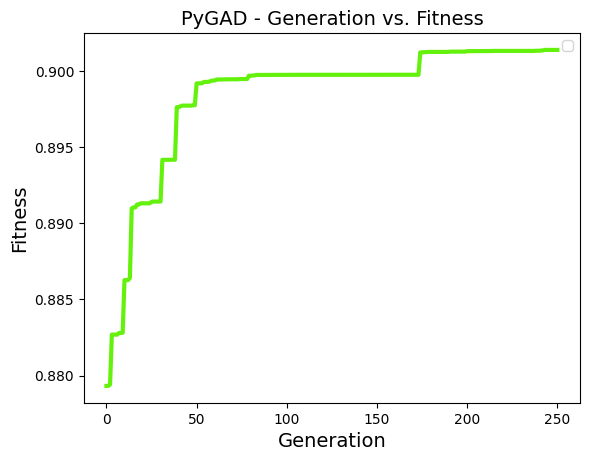

found solution with fitness 0.9013960361480713


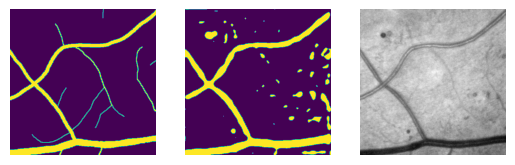

[img 49/450] starting next GA iterations...
[img 49/450] initial fitness = 0.7739091515541077


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


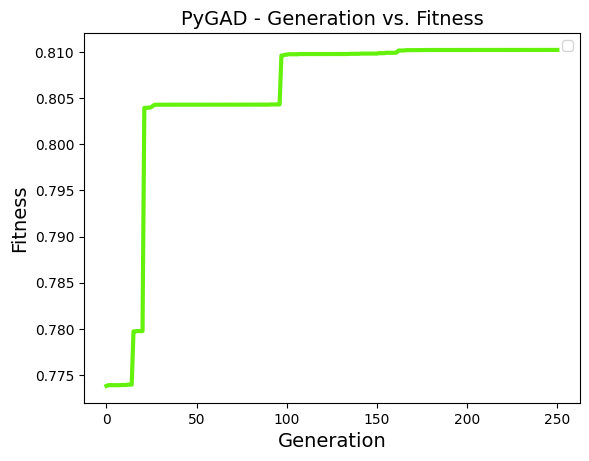

found solution with fitness 0.8102104663848877


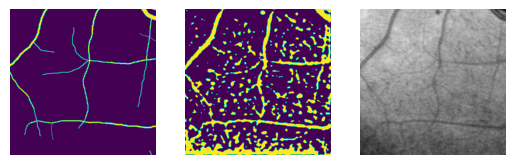

[img 50/450] starting next GA iterations...
[img 50/450] initial fitness = 0.8994577527046204


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


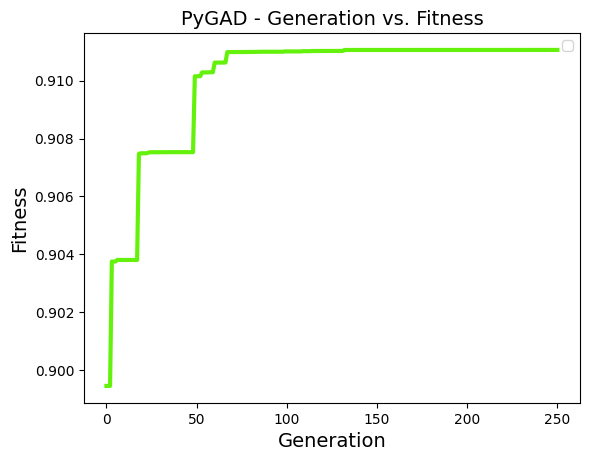

found solution with fitness 0.9110597372055054


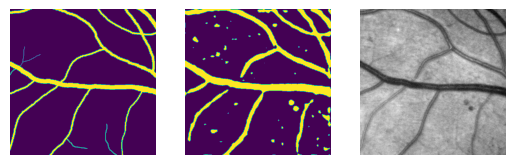

[img 51/450] starting next GA iterations...
[img 51/450] initial fitness = 0.8741925358772278


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


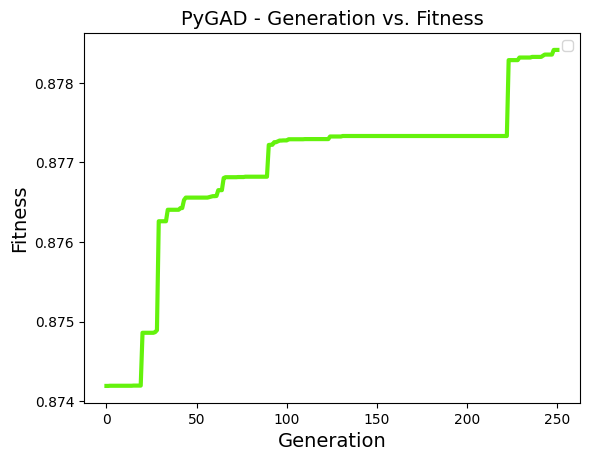

found solution with fitness 0.8784130811691284


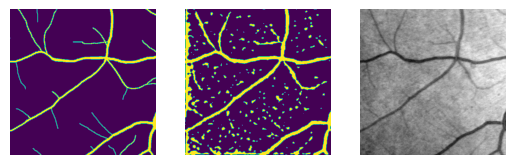

[img 52/450] starting next GA iterations...
[img 52/450] initial fitness = 0.8048876523971558


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


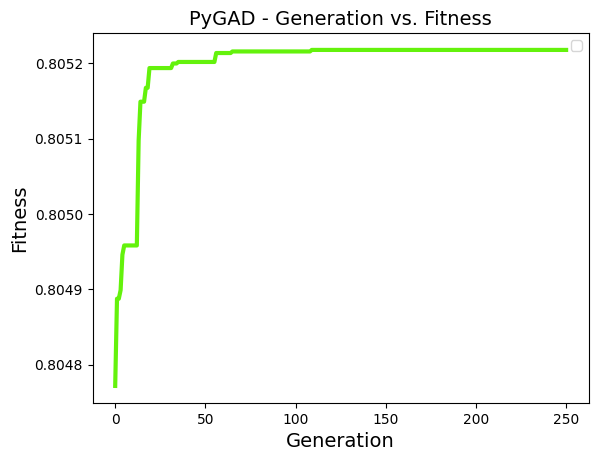

found solution with fitness 0.8052178621292114


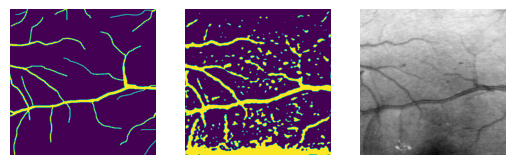

[img 53/450] starting next GA iterations...
[img 53/450] initial fitness = 0.8466218709945679


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


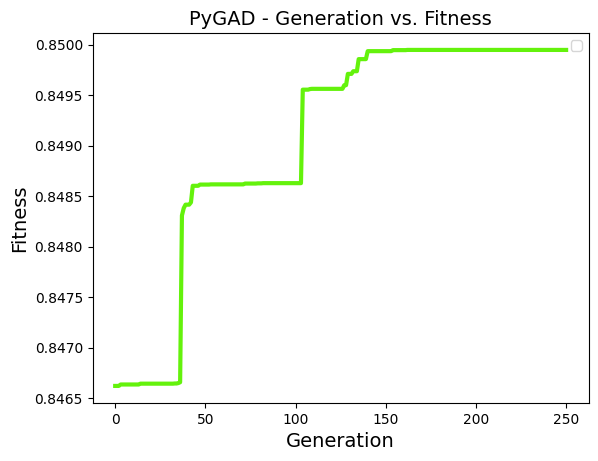

found solution with fitness 0.8499476909637451


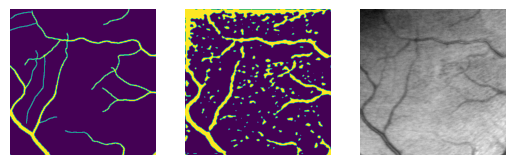

[img 54/450] starting next GA iterations...
[img 54/450] initial fitness = 0.8663369417190552


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


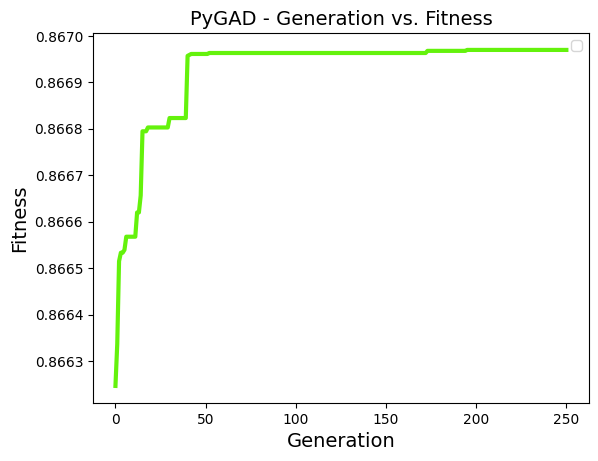

found solution with fitness 0.866969645023346


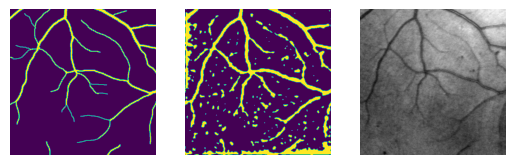

[img 55/450] starting next GA iterations...
[img 55/450] initial fitness = 0.8552066087722778


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


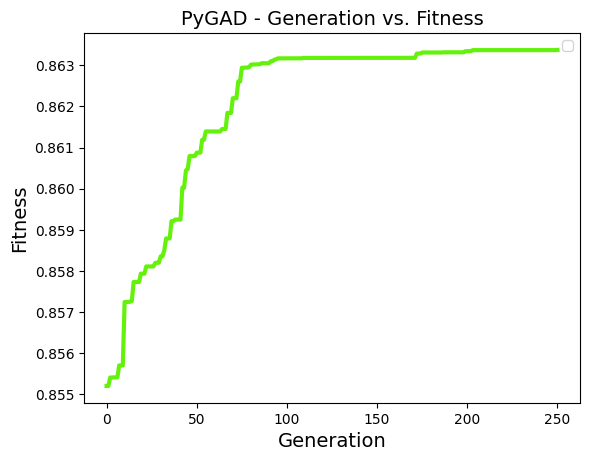

found solution with fitness 0.8633681535720825


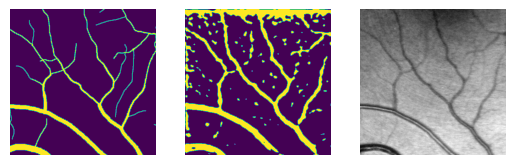

[img 56/450] starting next GA iterations...
[img 56/450] initial fitness = 0.7520555257797241


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


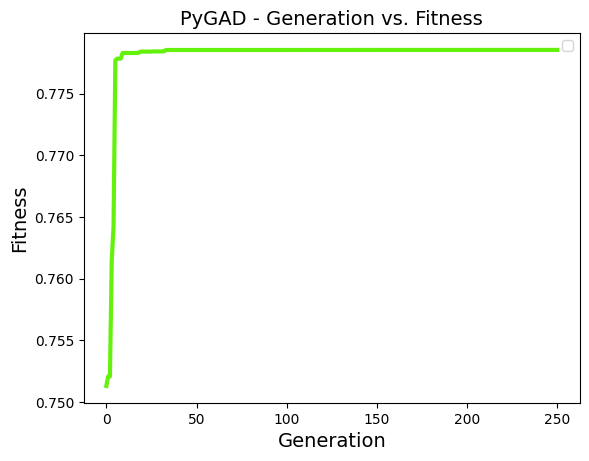

found solution with fitness 0.7785495519638062


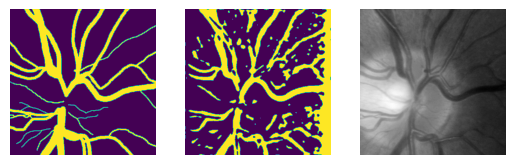

[img 57/450] starting next GA iterations...
[img 57/450] initial fitness = 0.7776386737823486


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


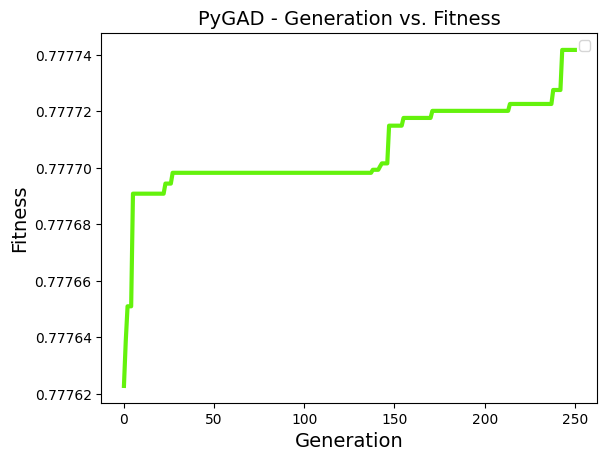

found solution with fitness 0.7777417898178101


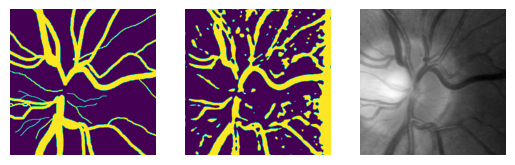

[img 58/450] starting next GA iterations...
[img 58/450] initial fitness = 0.8854215145111084


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


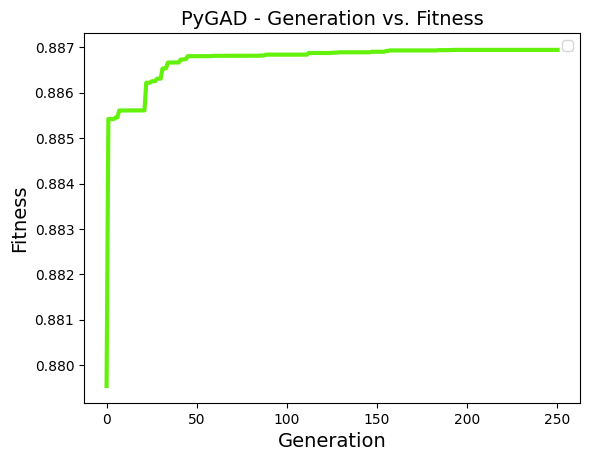

found solution with fitness 0.8869441747665405


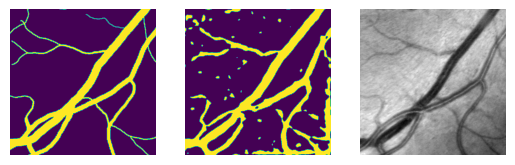

[img 59/450] starting next GA iterations...
[img 59/450] initial fitness = 0.869754433631897


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


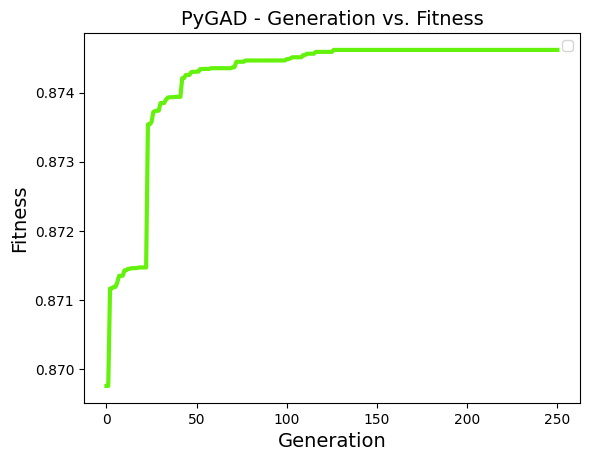

found solution with fitness 0.8746192455291748


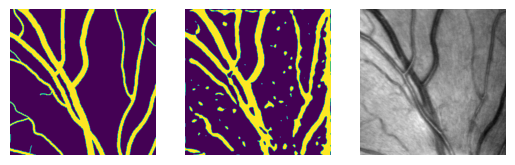

[img 60/450] starting next GA iterations...
[img 60/450] initial fitness = 0.8640785217285156


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


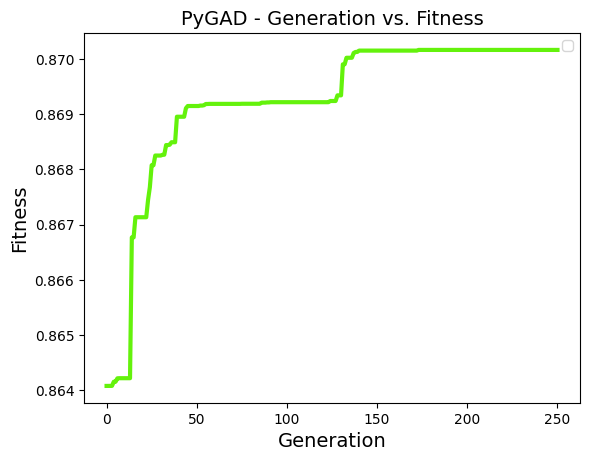

found solution with fitness 0.8701636791229248


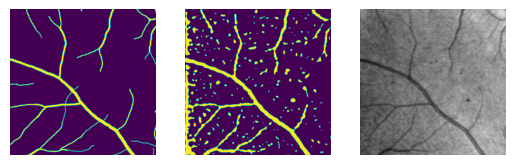

[img 61/450] starting next GA iterations...
[img 61/450] initial fitness = 0.8661066293716431


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


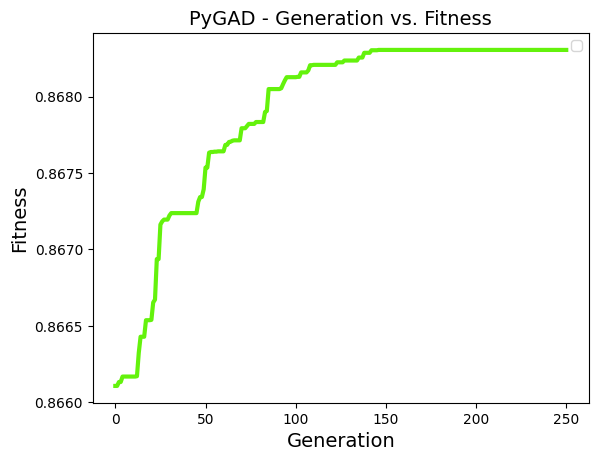

found solution with fitness 0.8683052062988281


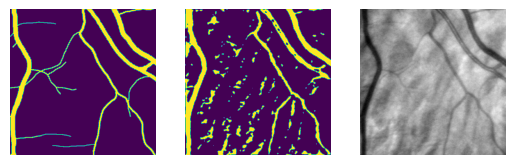

[img 62/450] starting next GA iterations...
[img 62/450] initial fitness = 0.7552121877670288


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


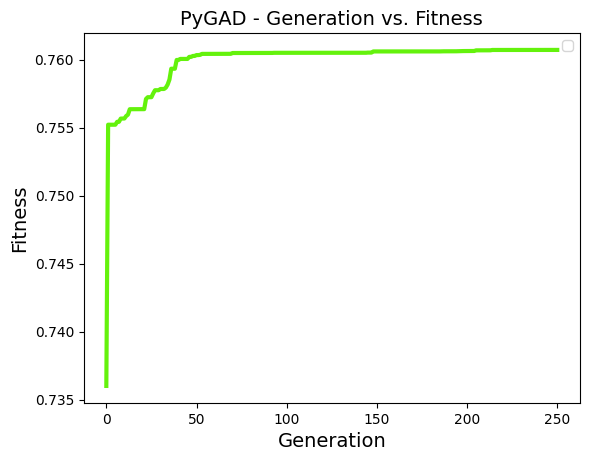

found solution with fitness 0.7607115507125854


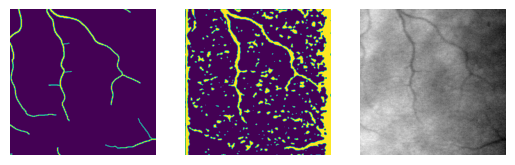

[img 63/450] starting next GA iterations...
[img 63/450] initial fitness = 0.8129768371582031


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


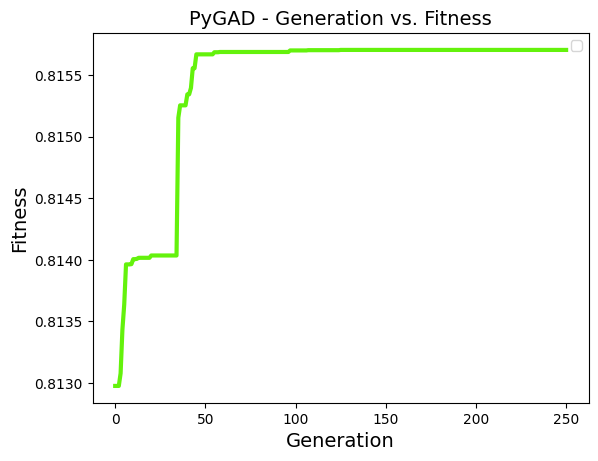

found solution with fitness 0.8157024383544922


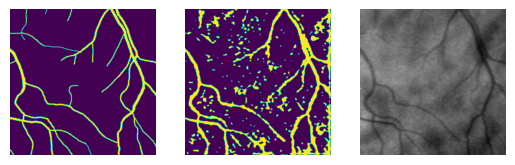

[img 64/450] starting next GA iterations...
[img 64/450] initial fitness = 0.8377522230148315


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


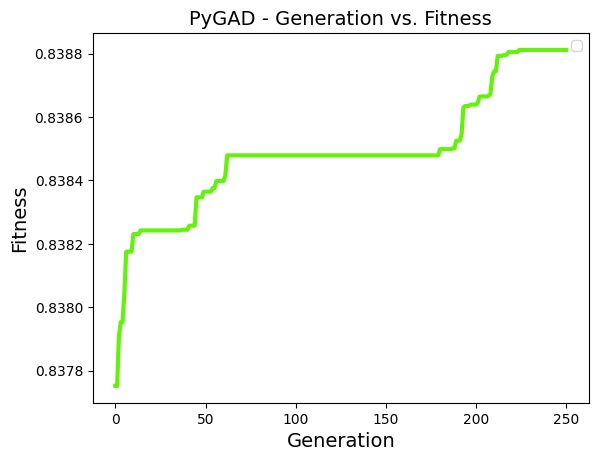

found solution with fitness 0.8388115167617798


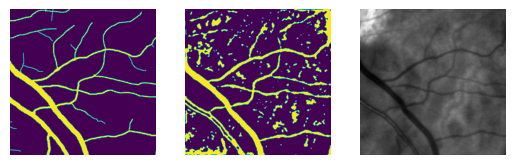

[img 65/450] starting next GA iterations...
[img 65/450] initial fitness = 0.7446961402893066


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


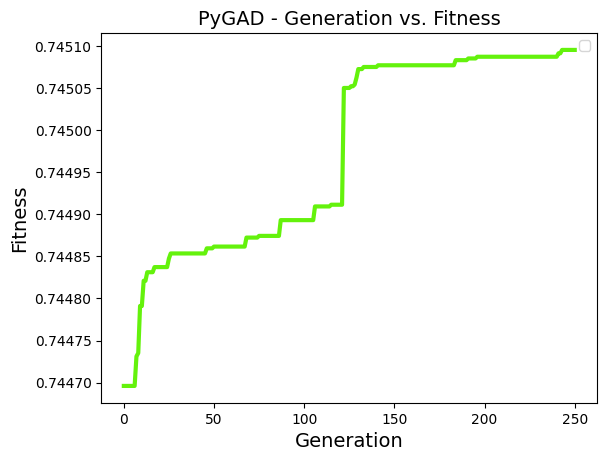

found solution with fitness 0.7450952529907227


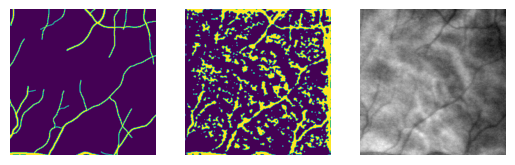

[img 66/450] starting next GA iterations...
[img 66/450] initial fitness = 0.8320692777633667


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


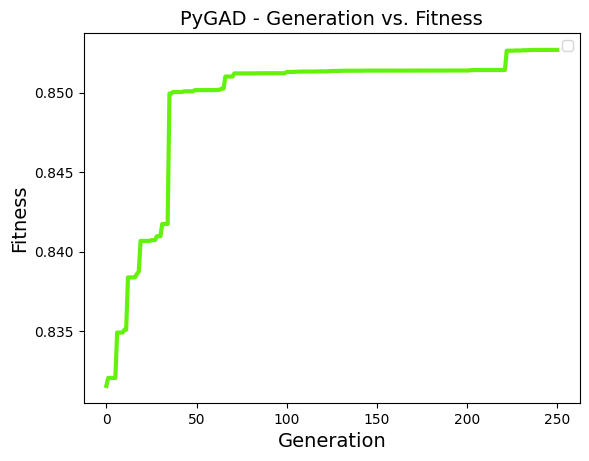

found solution with fitness 0.8526776432991028


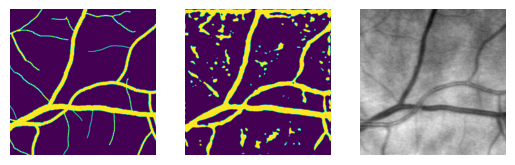

[img 67/450] starting next GA iterations...
[img 67/450] initial fitness = 0.8075385093688965


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


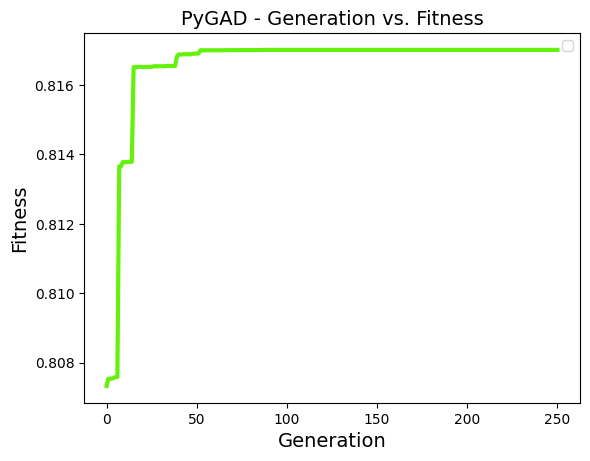

found solution with fitness 0.8170126080513


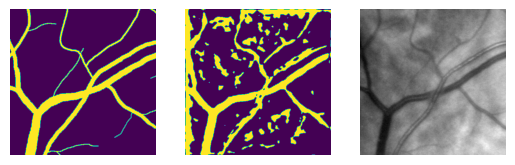

[img 68/450] starting next GA iterations...
[img 68/450] initial fitness = 0.8558976650238037


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


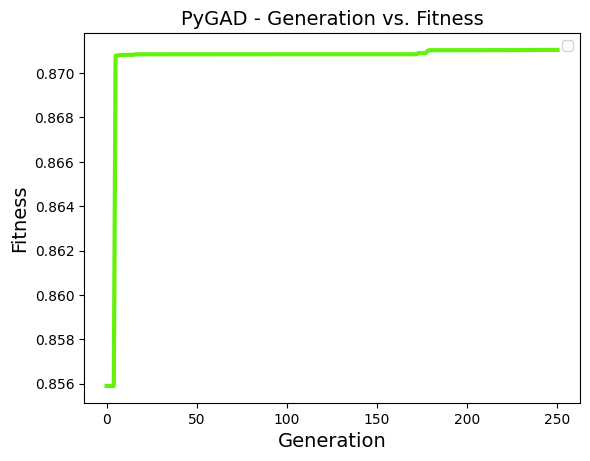

found solution with fitness 0.8710463047027588


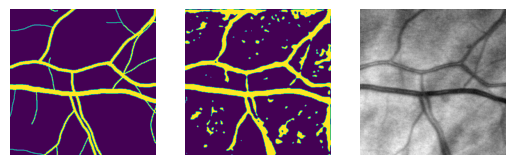

[img 69/450] starting next GA iterations...
[img 69/450] initial fitness = 0.8197460174560547


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


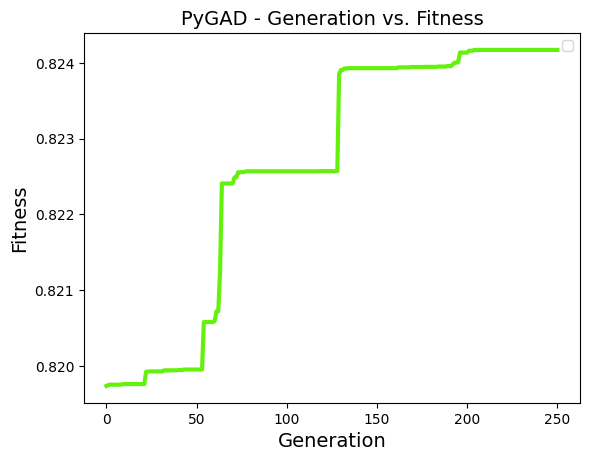

found solution with fitness 0.8241707682609558


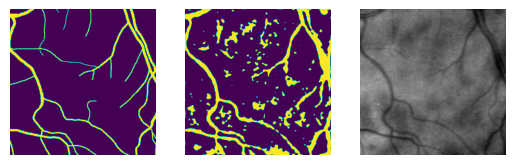

[img 70/450] starting next GA iterations...
[img 70/450] initial fitness = 0.7564660310745239


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


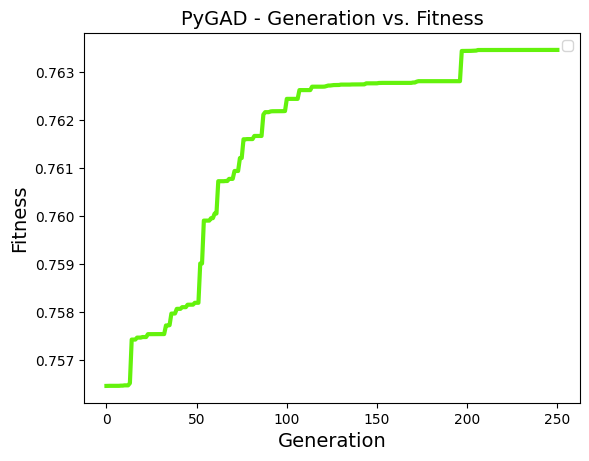

found solution with fitness 0.7634664177894592


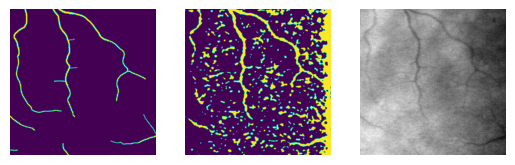

[img 71/450] starting next GA iterations...
[img 71/450] initial fitness = 0.8492156267166138


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


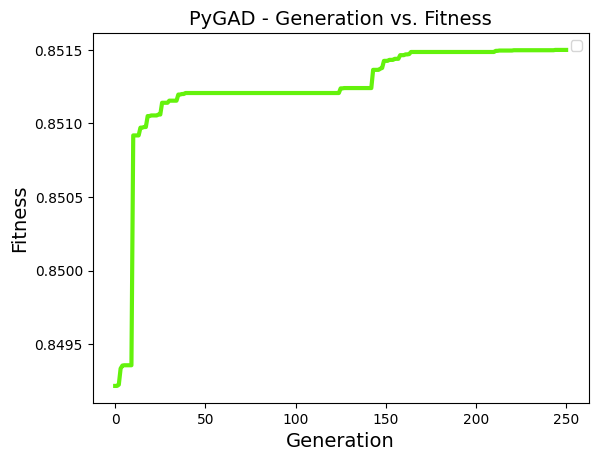

found solution with fitness 0.8514999747276306


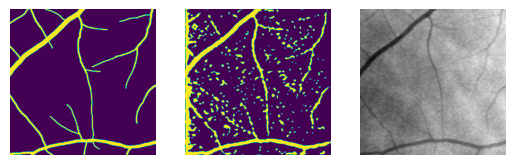

[img 72/450] starting next GA iterations...
[img 72/450] initial fitness = 0.8085669279098511


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


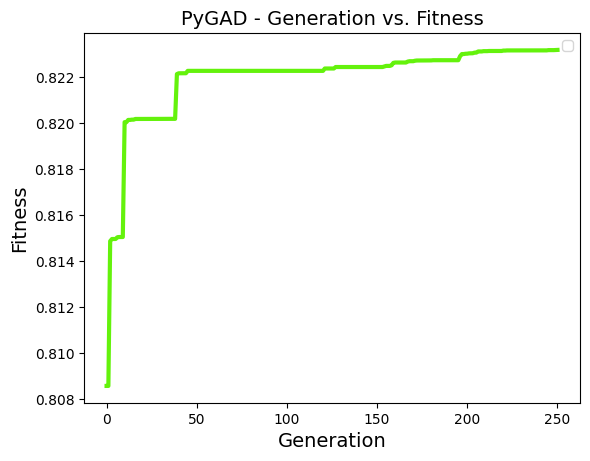

found solution with fitness 0.8231886625289917


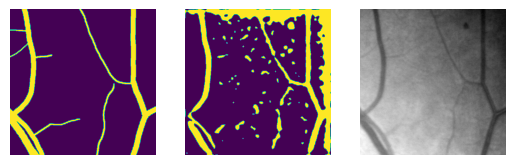

[img 73/450] starting next GA iterations...
[img 73/450] initial fitness = 0.7860854268074036


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


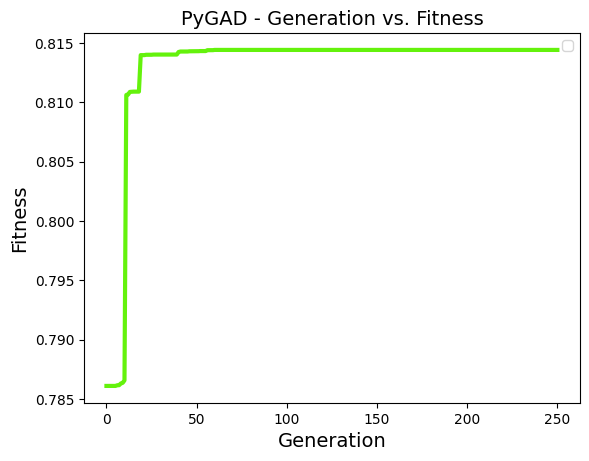

found solution with fitness 0.8144195675849915


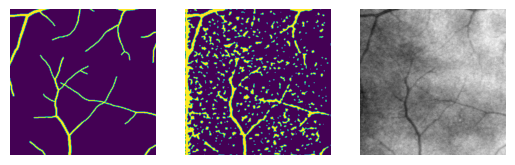

[img 74/450] starting next GA iterations...
[img 74/450] initial fitness = 0.8118147850036621


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


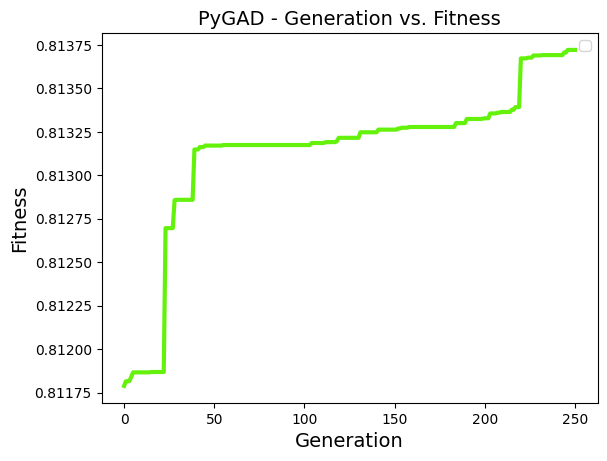

found solution with fitness 0.8137211799621582


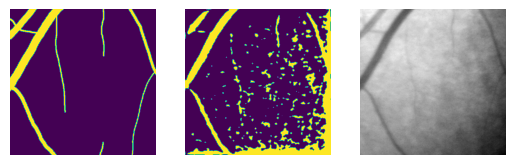

[img 75/450] starting next GA iterations...
[img 75/450] initial fitness = 0.8477001190185547


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


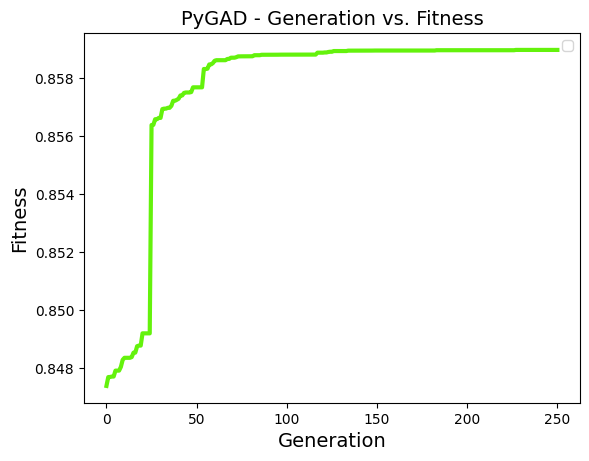

found solution with fitness 0.8589779138565063


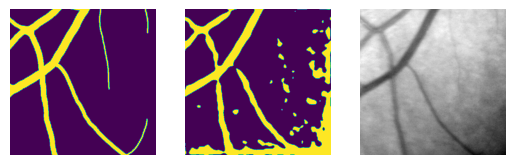

[img 76/450] starting next GA iterations...
[img 76/450] initial fitness = 0.876267671585083


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


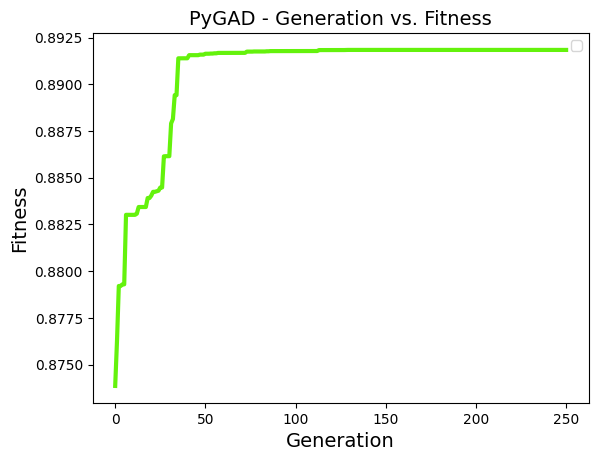

found solution with fitness 0.8918420076370239


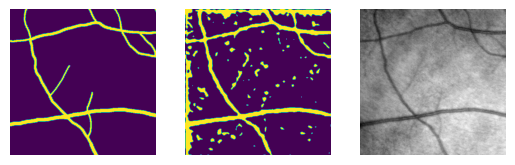

[img 77/450] starting next GA iterations...
[img 77/450] initial fitness = 0.8683268427848816


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


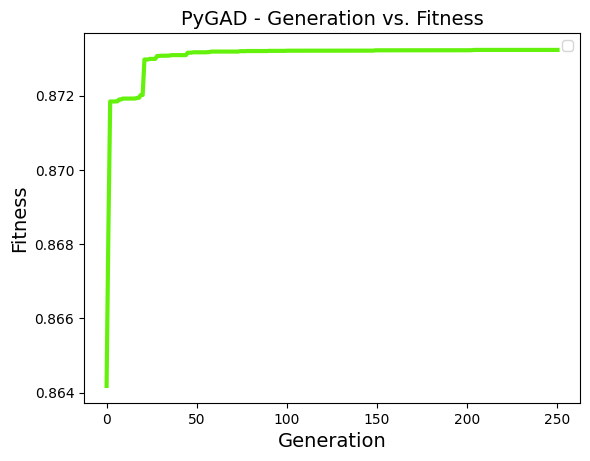

found solution with fitness 0.8732314109802246


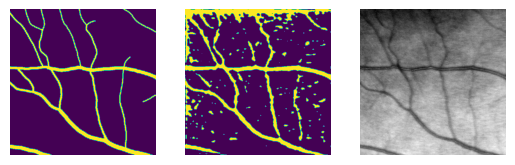

[img 78/450] starting next GA iterations...
[img 78/450] initial fitness = 0.8741695880889893


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


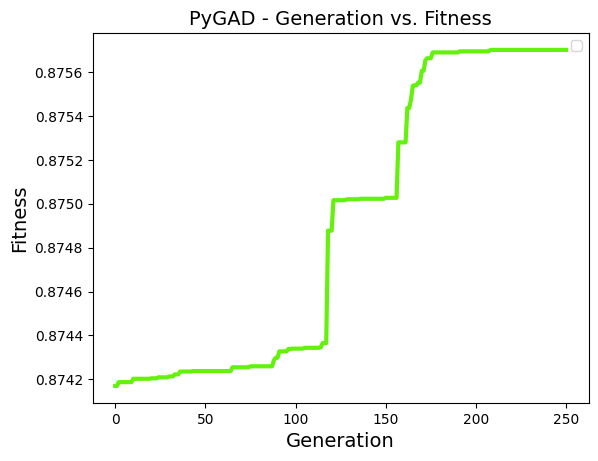

found solution with fitness 0.8757013082504272


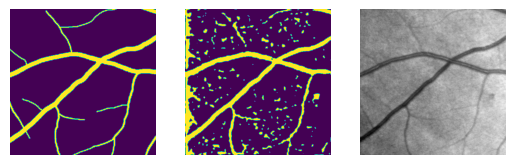

[img 79/450] starting next GA iterations...
[img 79/450] initial fitness = 0.8860422372817993


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


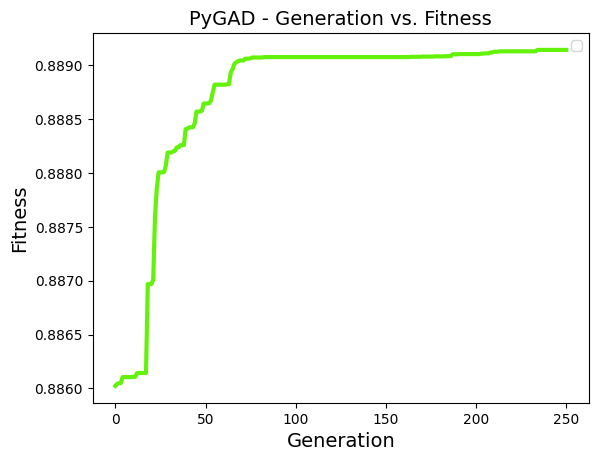

found solution with fitness 0.889144241809845


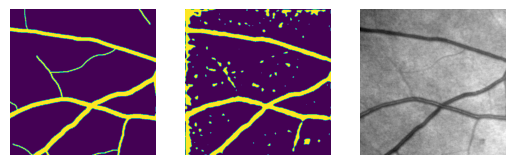

[img 80/450] starting next GA iterations...
[img 80/450] initial fitness = 0.8804344534873962


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


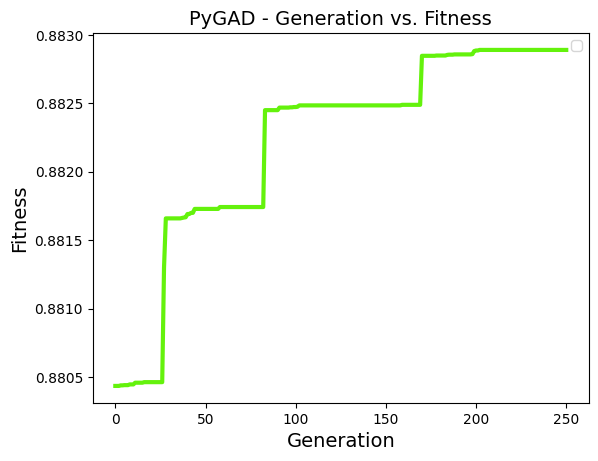

found solution with fitness 0.8828908205032349


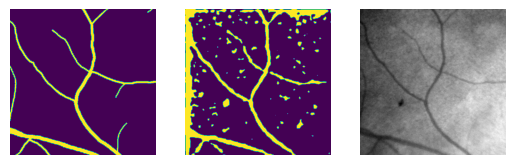

[img 81/450] starting next GA iterations...
[img 81/450] initial fitness = 0.8503527641296387


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


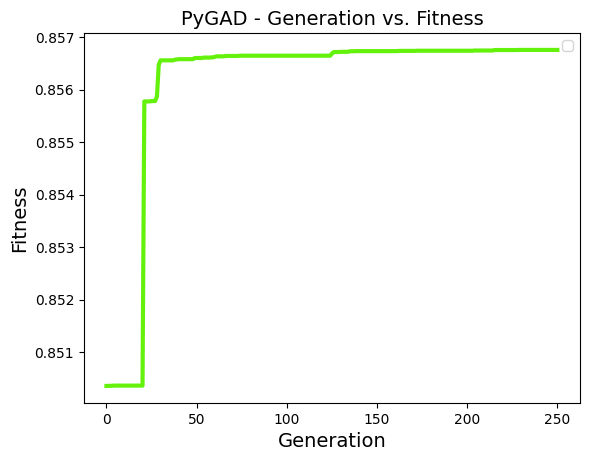

found solution with fitness 0.8567593097686768


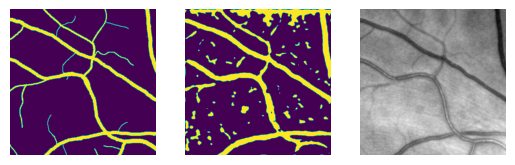

[img 82/450] starting next GA iterations...
[img 82/450] initial fitness = 0.831954836845398


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


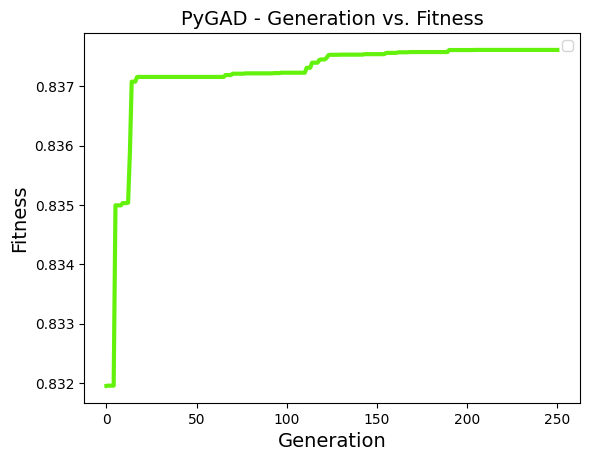

found solution with fitness 0.8376107215881348


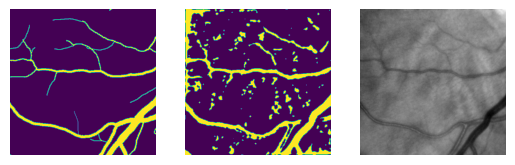

[img 83/450] starting next GA iterations...
[img 83/450] initial fitness = 0.8349028825759888


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


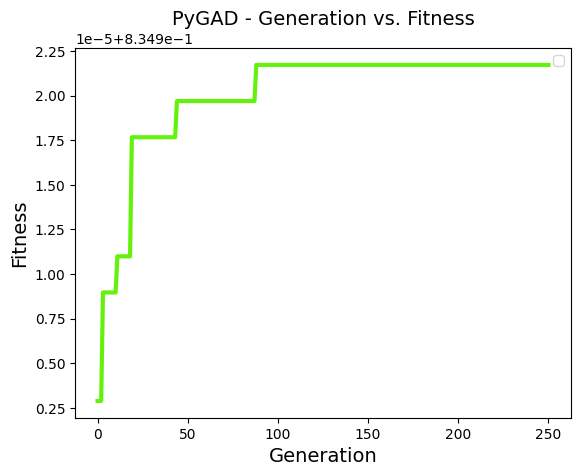

found solution with fitness 0.8349217176437378


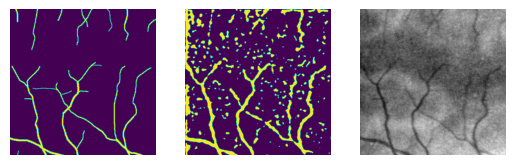

[img 84/450] starting next GA iterations...
[img 84/450] initial fitness = 0.8368027210235596


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


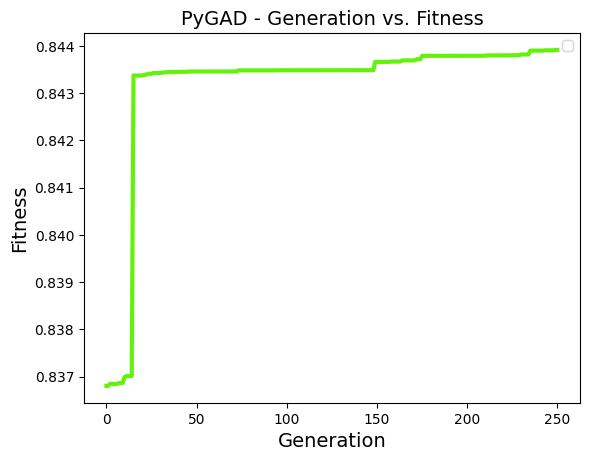

found solution with fitness 0.8439172506332397


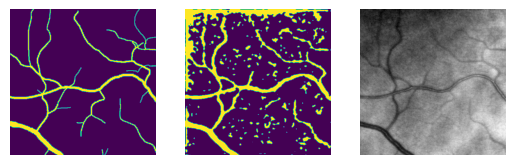

[img 85/450] starting next GA iterations...
[img 85/450] initial fitness = 0.8287877440452576


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


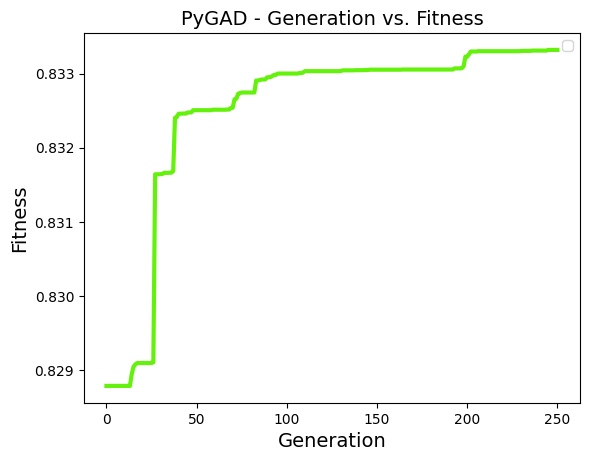

found solution with fitness 0.833319902420044


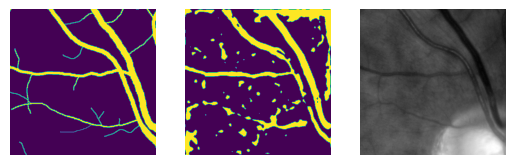

[img 86/450] starting next GA iterations...
[img 86/450] initial fitness = 0.7957439422607422


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


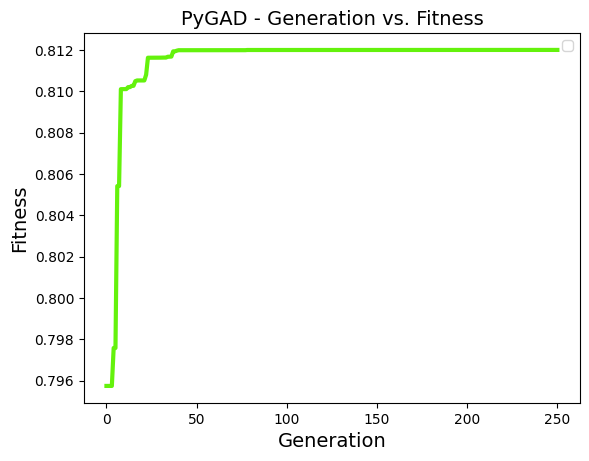

found solution with fitness 0.8119958639144897


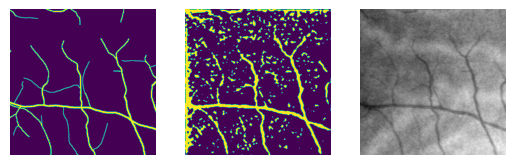

[img 87/450] starting next GA iterations...
[img 87/450] initial fitness = 0.8497945070266724


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


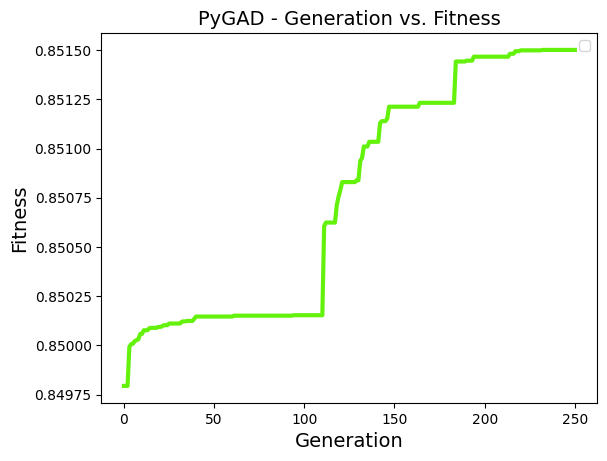

found solution with fitness 0.8515008687973022


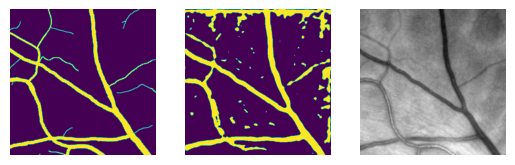

[img 88/450] starting next GA iterations...
[img 88/450] initial fitness = 0.8641787767410278


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


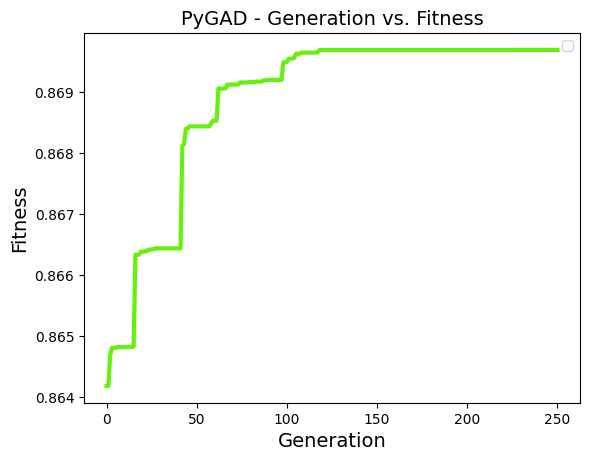

found solution with fitness 0.869694709777832


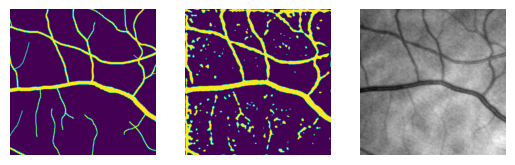

[img 89/450] starting next GA iterations...
[img 89/450] initial fitness = 0.8073419332504272


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


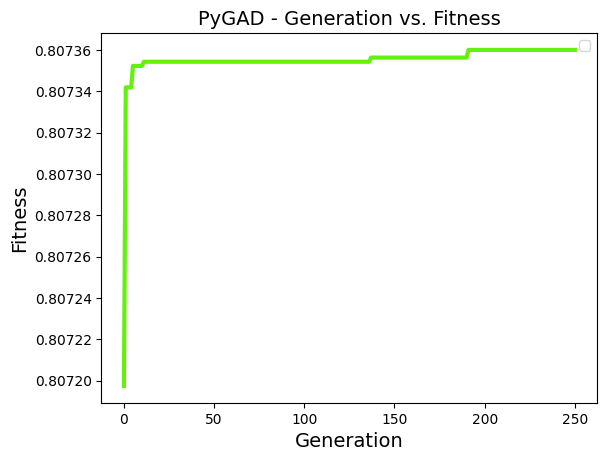

found solution with fitness 0.807360053062439


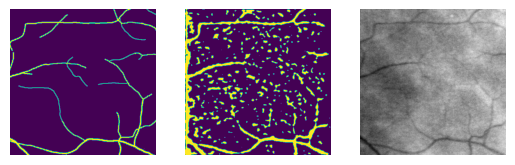

[img 90/450] starting next GA iterations...
[img 90/450] initial fitness = 0.7965182662010193


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


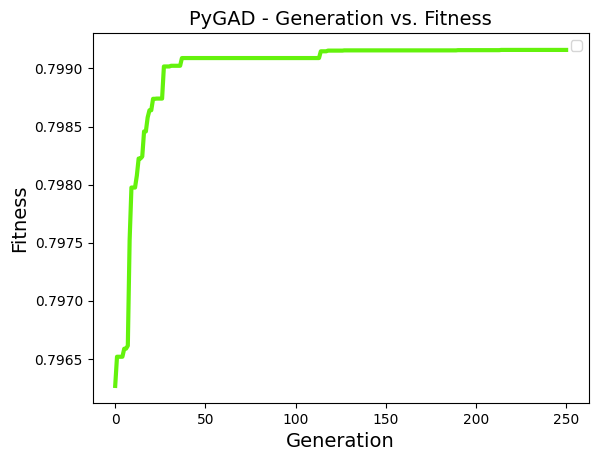

found solution with fitness 0.7991594076156616


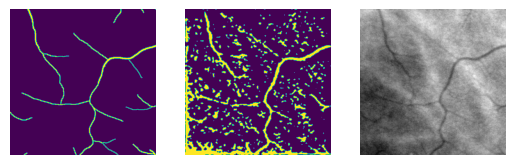

[img 91/450] starting next GA iterations...
[img 91/450] initial fitness = 0.890780508518219


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


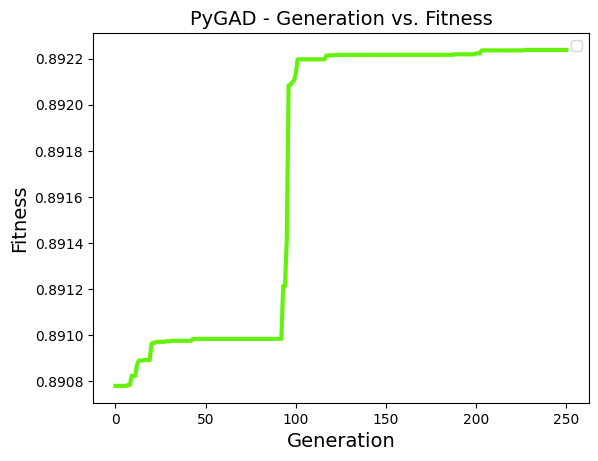

found solution with fitness 0.8922379016876221


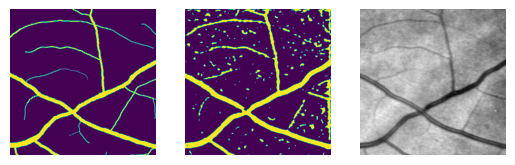

[img 92/450] starting next GA iterations...
[img 92/450] initial fitness = 0.8493227958679199


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


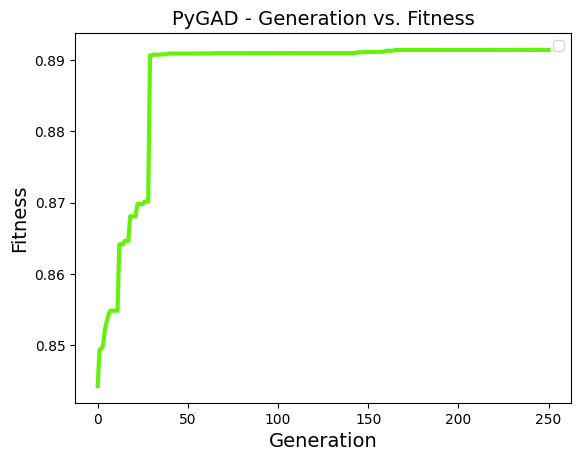

found solution with fitness 0.8914033770561218


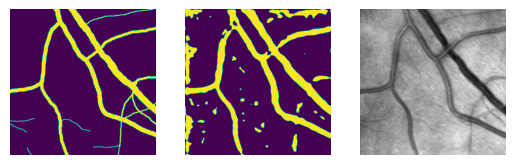

[img 93/450] starting next GA iterations...
[img 93/450] initial fitness = 0.8842072486877441


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


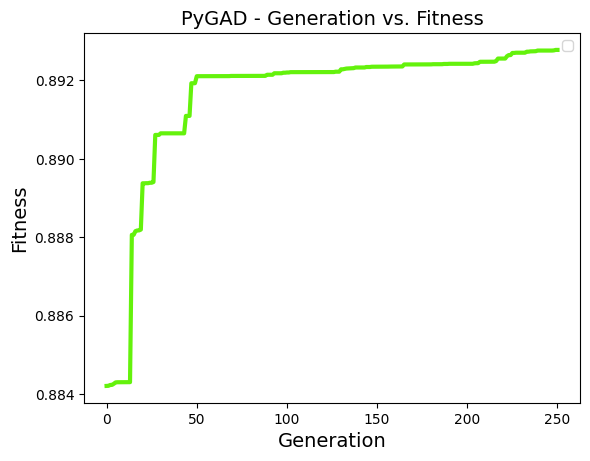

found solution with fitness 0.8927797675132751


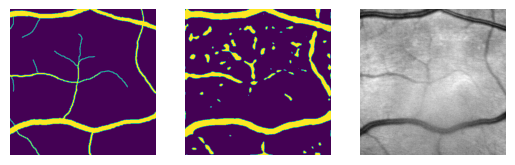

[img 94/450] starting next GA iterations...
[img 94/450] initial fitness = 0.853352963924408


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


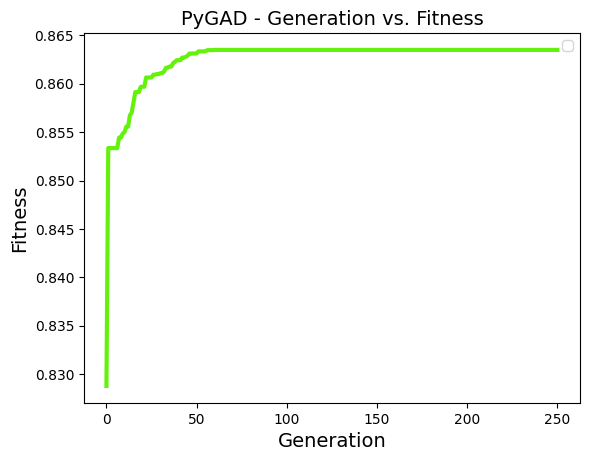

found solution with fitness 0.8634967803955078


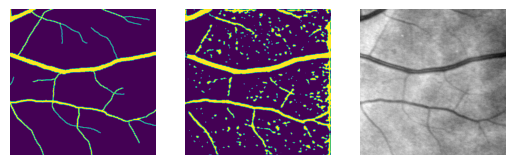

[img 95/450] starting next GA iterations...
[img 95/450] initial fitness = 0.8603613376617432


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


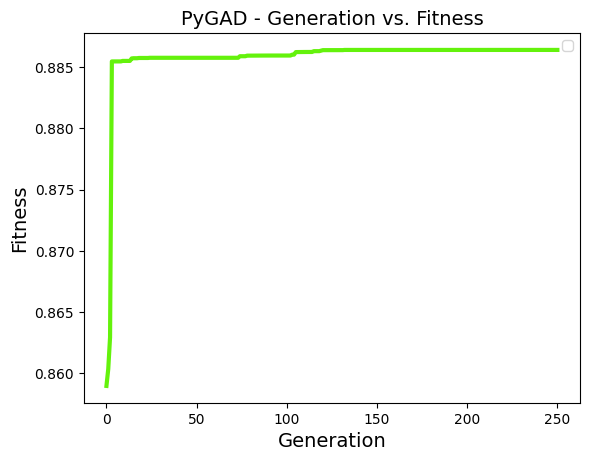

found solution with fitness 0.8863921165466309


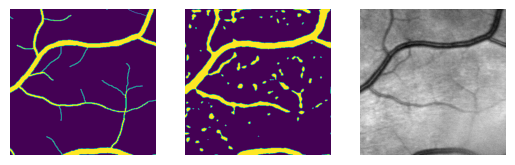

[img 96/450] starting next GA iterations...
[img 96/450] initial fitness = 0.8640635013580322


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


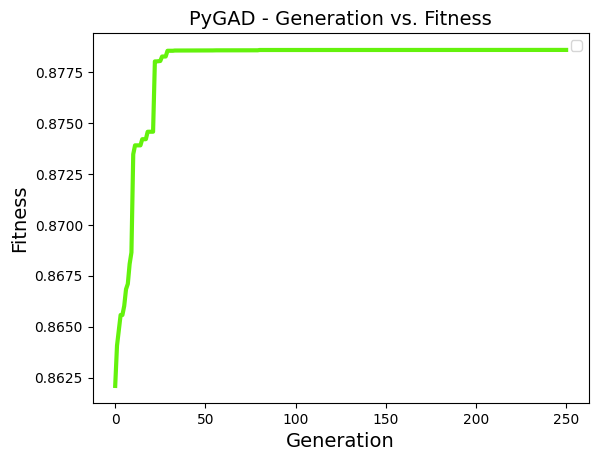

found solution with fitness 0.8785866498947144


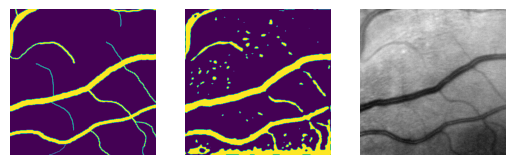

[img 97/450] starting next GA iterations...
[img 97/450] initial fitness = 0.8888895511627197


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


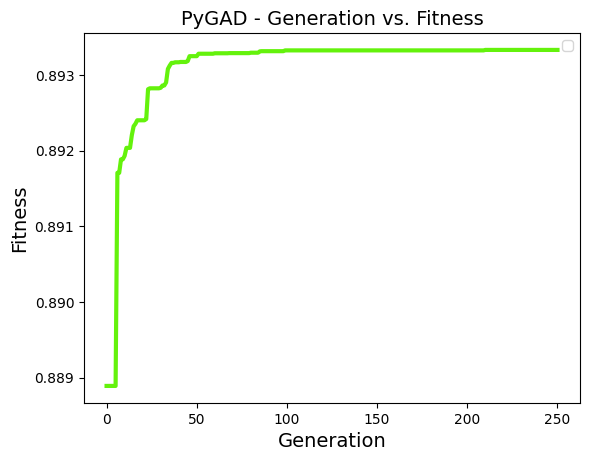

found solution with fitness 0.8933308124542236


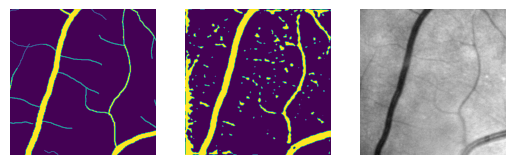

[img 98/450] starting next GA iterations...
[img 98/450] initial fitness = 0.8008205890655518


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


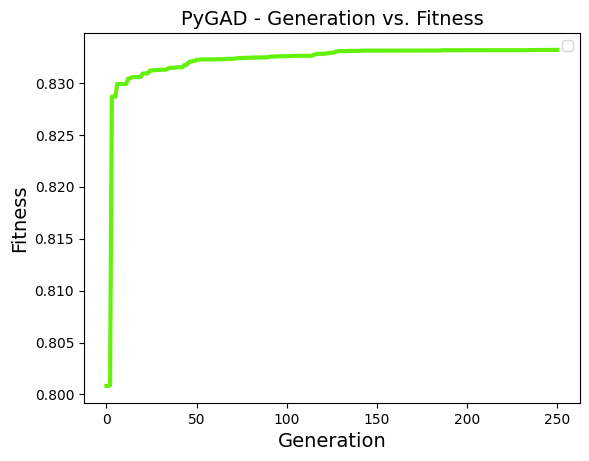

found solution with fitness 0.8331806063652039


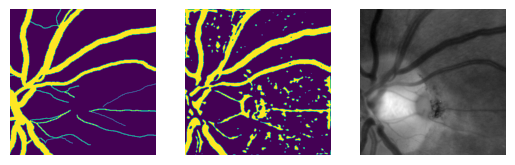

[img 99/450] starting next GA iterations...
[img 99/450] initial fitness = 0.8948663473129272


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


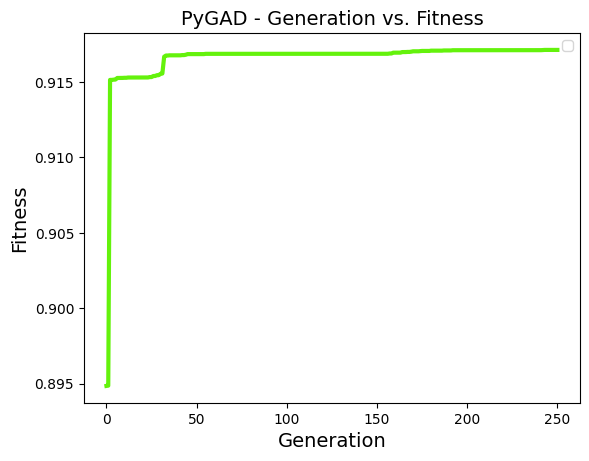

found solution with fitness 0.9171329736709595


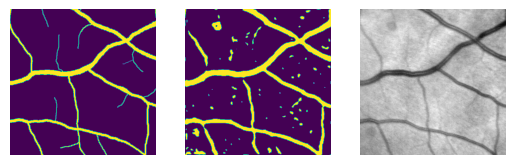

[img 100/450] starting next GA iterations...
[img 100/450] initial fitness = 0.8916964530944824


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


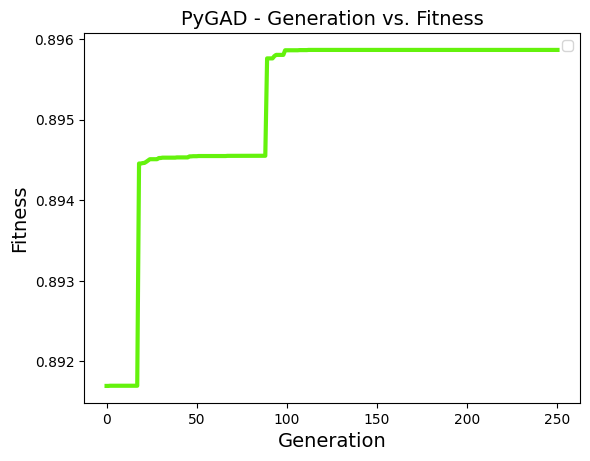

found solution with fitness 0.8958632349967957


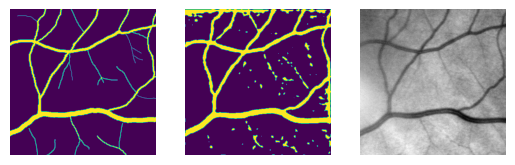

[img 101/450] starting next GA iterations...
[img 101/450] initial fitness = 0.8241934776306152


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


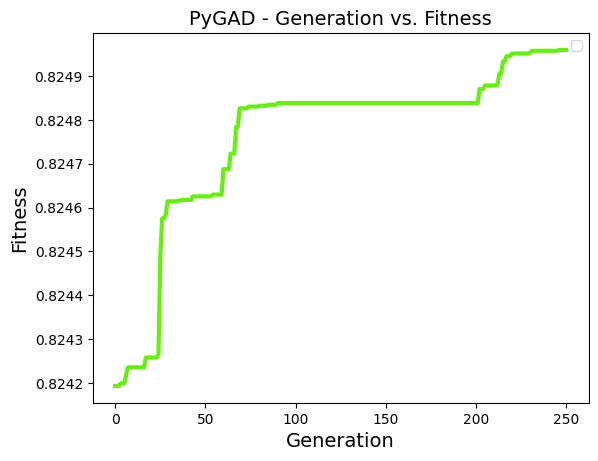

found solution with fitness 0.824959397315979


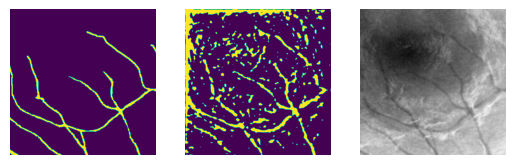

[img 102/450] starting next GA iterations...
[img 102/450] initial fitness = 0.875572919845581


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


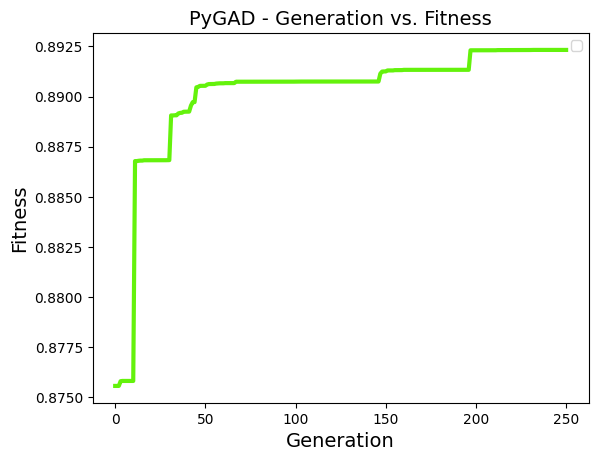

found solution with fitness 0.8923238515853882


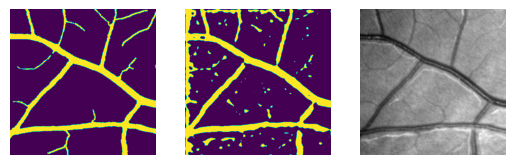

[img 103/450] starting next GA iterations...
[img 103/450] initial fitness = 0.8299139738082886


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


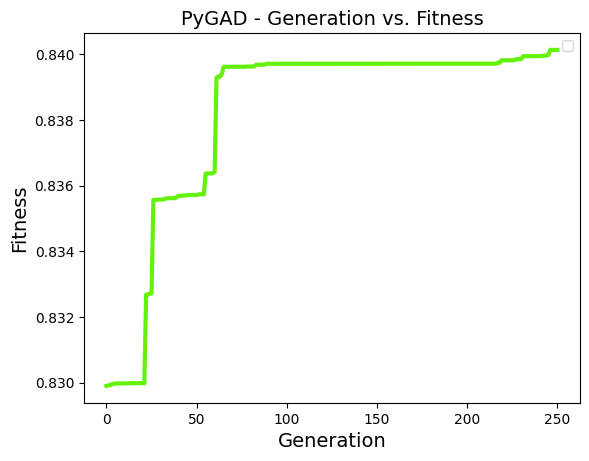

found solution with fitness 0.8401283025741577


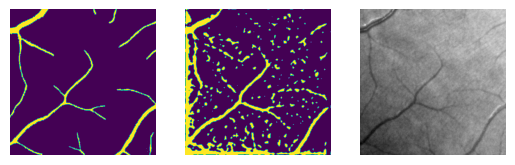

[img 104/450] starting next GA iterations...
[img 104/450] initial fitness = 0.8791298866271973


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


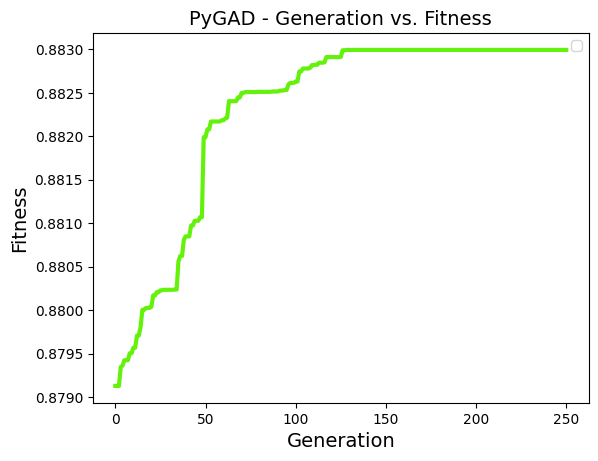

found solution with fitness 0.8829929828643799


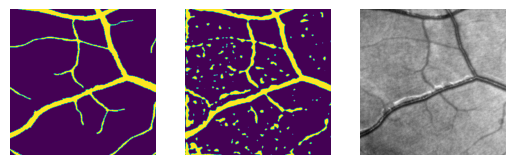

[img 105/450] starting next GA iterations...
[img 105/450] initial fitness = 0.8143799304962158


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


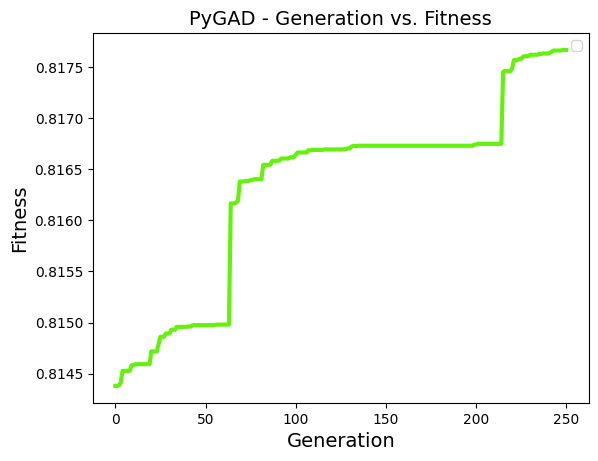

found solution with fitness 0.8176689743995667


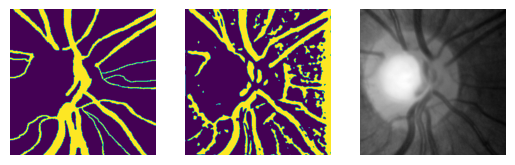

[img 106/450] starting next GA iterations...
[img 106/450] initial fitness = 0.8106262683868408


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


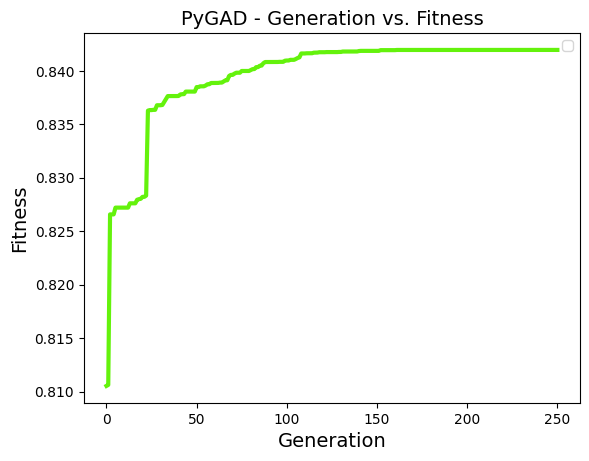

found solution with fitness 0.8419548273086548


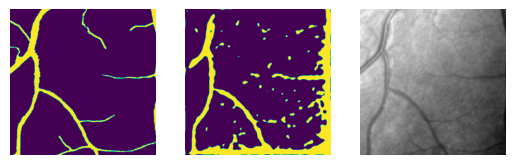

[img 107/450] starting next GA iterations...
[img 107/450] initial fitness = 0.8533663749694824


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


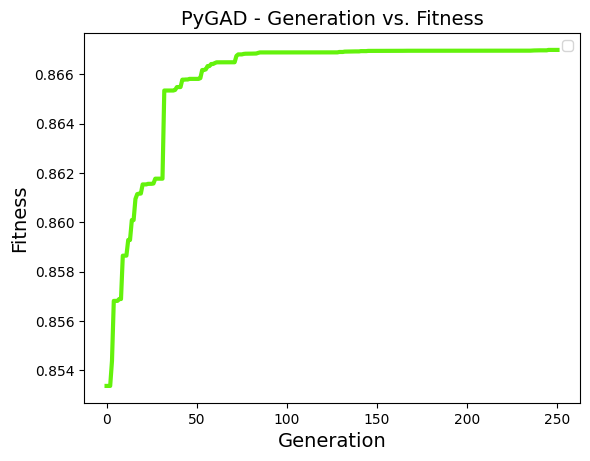

found solution with fitness 0.8669947981834412


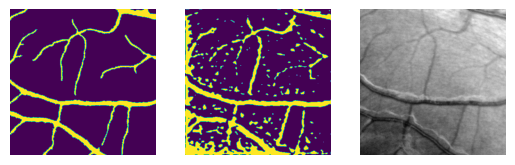

[img 108/450] starting next GA iterations...
[img 108/450] initial fitness = 0.8490868806838989


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


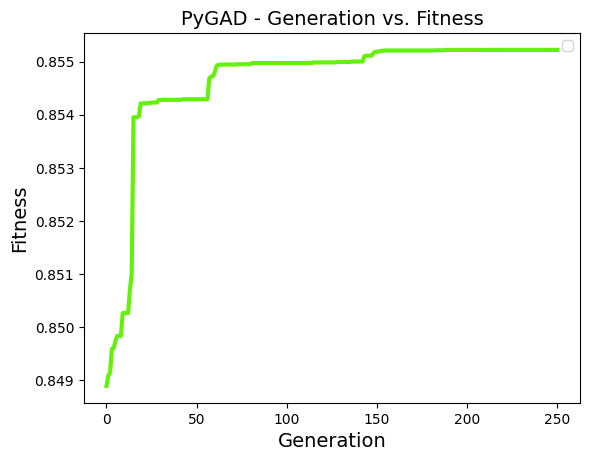

found solution with fitness 0.8552203178405762


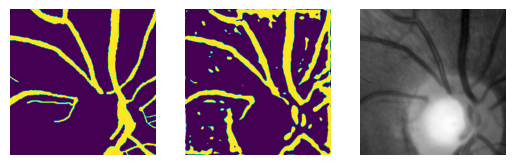

[img 109/450] starting next GA iterations...
[img 109/450] initial fitness = 0.8229693174362183


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


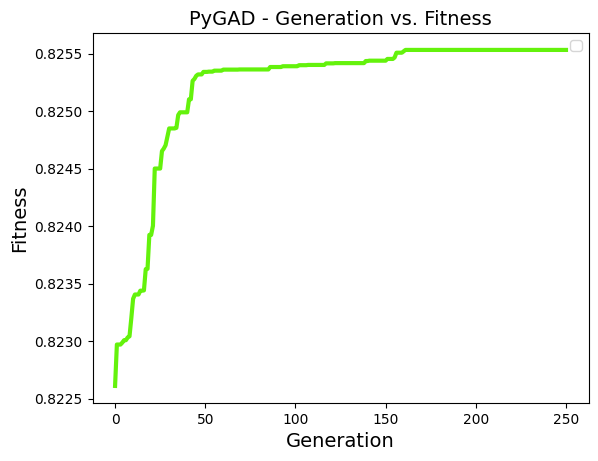

found solution with fitness 0.8255314826965332


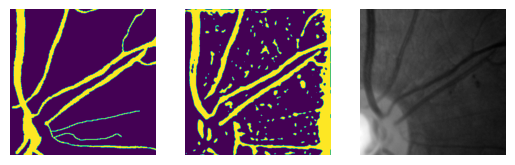

[img 110/450] starting next GA iterations...
[img 110/450] initial fitness = 0.8784658908843994


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


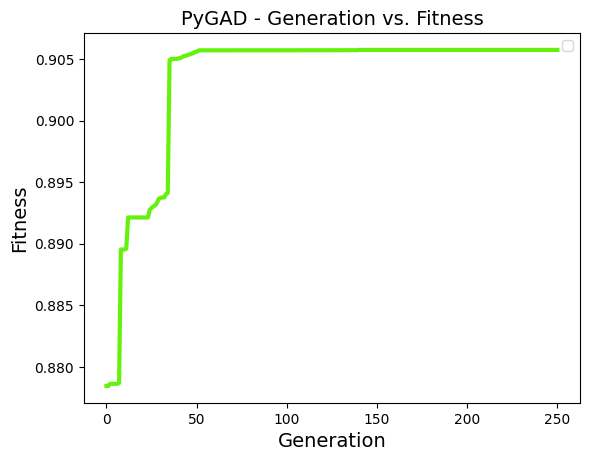

found solution with fitness 0.9057275056838989


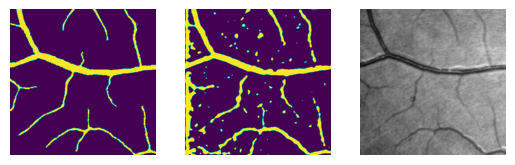

[img 111/450] starting next GA iterations...
[img 111/450] initial fitness = 0.7830504179000854


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


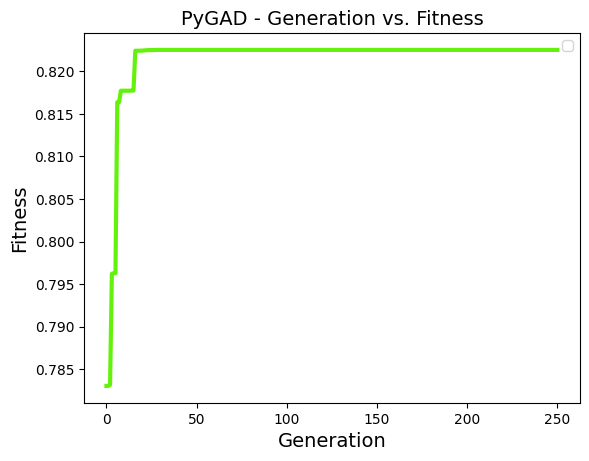

found solution with fitness 0.8225155472755432


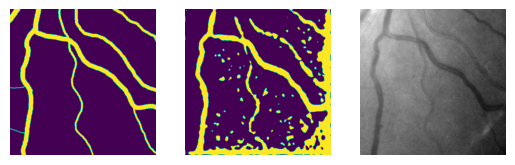

[img 112/450] starting next GA iterations...
[img 112/450] initial fitness = 0.6427093148231506


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


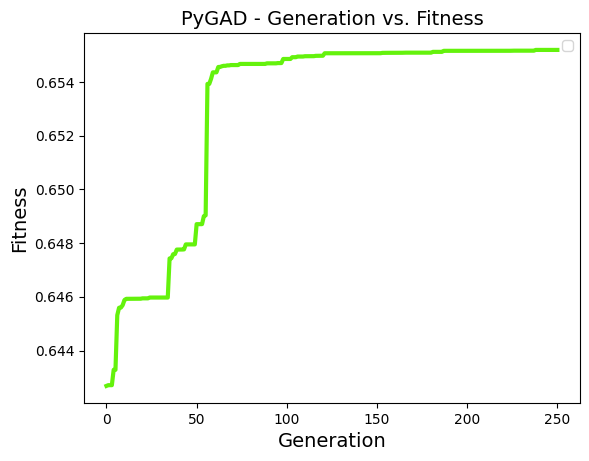

found solution with fitness 0.6551916599273682


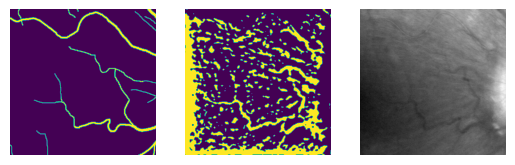

[img 113/450] starting next GA iterations...
[img 113/450] initial fitness = 0.6819735169410706


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


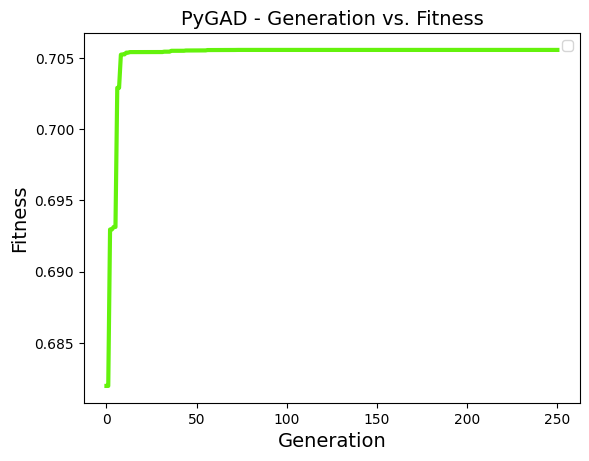

found solution with fitness 0.7055755853652954


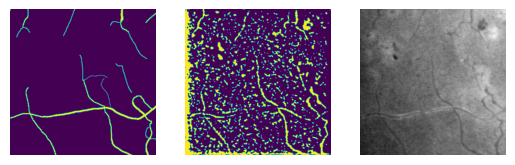

[img 114/450] starting next GA iterations...
[img 114/450] initial fitness = 0.7221511006355286


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


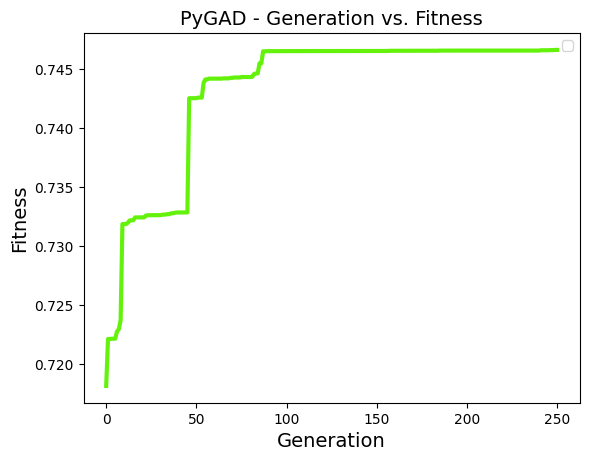

found solution with fitness 0.746609091758728


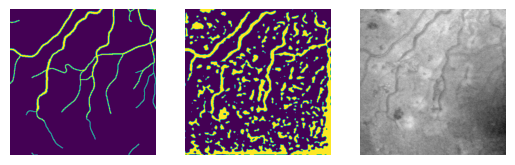

[img 115/450] starting next GA iterations...
[img 115/450] initial fitness = 0.7084677815437317


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


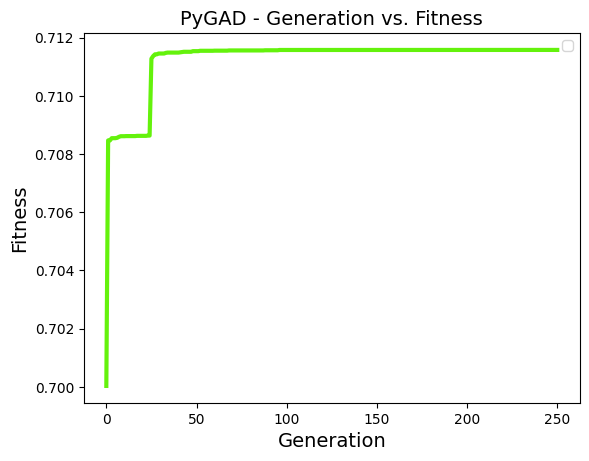

found solution with fitness 0.7115778923034668


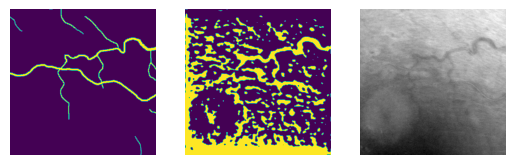

[img 116/450] starting next GA iterations...
[img 116/450] initial fitness = 0.8300244808197021


In [32]:
labeler = alg.PSTLabeler()

solutions = []
fits = []
last_pop = None
for i, (image, gt) in enumerate(zip(images, gtruth)):
    solution, fitness, last_pop = run_ga_for(image, gt, labeler, metric, f"img {i+1}/{len(images)}", last_pop)
    solutions.append(solution)
    fits.append(fitness)
parameters = np.stack(solutions)
np.save(f"../dataset/next_partial_parameters_{pshape[0]}_{pshape[1]}.npy", parameters, allow_pickle=False)
np.save(f"../dataset/next_partial_fitness_{pshape[0]}_{pshape[1]}.npy", np.array(fits), allow_pickle=False)

In [ ]:
plt.plot(parameters[:,0])